# 1. Importing Libraries

In [1]:
# importing necessary libraries
import numpy as np                                             # importing numpy library and name it as np
import matplotlib.pyplot as plt                                # importing matplotlib library for visualization
import calendar                                                # importing calendar library  
%matplotlib inline                               
# installing libraries for machine learning 
!pip install -U scikit-learn --user 
# installing library for XGBoost Regression
!pip install xgboost
import gc                                                      # importing Garbage Collector (GC)
import pandas as pd                                            # importing pandas for numeric operations
import seaborn as sns                                          # importing seaborn for data visualization
from sklearn import svm                                        # importing Support Vector Machine
from sklearn.impute import KNNImputer                          # importing library for KNN and Regression
from sklearn.model_selection import train_test_split           # importing library to split a dataset into training and testing subsets
from sklearn.neighbors import KNeighborsClassifier             # importing library for KNN and Regression
from sklearn.preprocessing import StandardScaler               # importing library for standardizing features
from sklearn.linear_model import LinearRegression              # importing library for LinearRegression
from sklearn.ensemble import RandomForestRegressor             # importing library for RandomForestRegressor
from sklearn.svm import SVR                                    # importing library for SupportVectorRegression
from sklearn.ensemble import GradientBoostingRegressor         # importing libraryGradientBoostingRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error # importing library to calculate the coefficient of determination (R²), to quantify if regression model fits the data
from sklearn.preprocessing import PolynomialFeatures           # importing library for creating polynomial and interaction features in machine learning
from sklearn.linear_model import SGDClassifier                 # importing library for training linear classifiers using stochastic gradient descent (SGD)
from sklearn.metrics import accuracy_score                     # importing library for evaluating classification models
from sklearn import metrics                                    # importing library for evaluating the quality of predictions in machine learning models (classifiers, regressors, and clustering algorithms)
from sklearn.metrics import confusion_matrix                   # importing library for confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay             # Importing the ConfusionMatrixDisplay class from sklearn.metrics used for plotting a confusion matrix
from sklearn import preprocessing                              # importing library for preprocessing
from sklearn.pipeline import Pipeline                          # importing library for Pipeline
from sklearn.compose import ColumnTransformer                  # importing library for ColumnTransformer
from sklearn.tree import DecisionTreeRegressor                 # importing library for DecisionTreeRegressor
from joblib import dump, load                                  # Importing 'dump' and 'load' functions from 'joblib' 
from sklearn.ensemble import StackingRegressor                 # importing library for StackingRegressor 
from sklearn.linear_model import LogisticRegression            # importing library for LogisticRegression
from sklearn.svm import SVC                                    # importing library for Support Vector Classifier
from sklearn.dummy import DummyRegressor                       # importinglibrary for  DummyRegressor
from sklearn.preprocessing import FunctionTransformer          # importing library to have "log(x)"
from sklearn.preprocessing import PowerTransformer             # importing library to have "Pipeline"
from sklearn.preprocessing import MinMaxScaler                 # importing library to have "MinMaxScaler"
from sklearn.impute import SimpleImputer                       # importing library to have "SimpleImputer"
from xgboost import XGBRegressor                               # importing library to have "XGBRegressor"
from math import sqrt                                          # Import the sqrt function from the math module to perform square root calculations

Defaulting to user installation because normal site-packages is not writeable


# 2. Reading from File

In [2]:
 # reading data from files
ele = pd.read_csv("F:\\AI Assignment\\ele.csv")
ele1 = ele.drop('unnamed', axis=1)                                # removing column with no heading that includes a lot of "NAN"
occ = pd.read_csv("F:\\AI Assignment\\occ.csv")
site_weather = pd.read_csv("F:\\AI Assignment\\site_weather.csv",skiprows=[1, 2, 3, 4]) # removing extra data (4 first rows)
# removing dew temp. as it contains large number of outliers
site_weather1 = site_weather.drop('dew_point_temperature_set_1d', axis=1) 
hp_hws_temp = pd.read_csv("F:\\AI Assignment\\hp_hws_temp.csv")
zone_temp_interior = pd.read_csv("F:\\AI Assignment\\zone_temp_interior.csv")
rtu_fan_spd = pd.read_csv("F:\\AI Assignment\\rtu_fan_spd.csv")
rtu_sa_t_sp = pd.read_csv("F:\\AI Assignment\\rtu_sa_t_sp.csv")
rtu_sa_t = pd.read_csv("F:\\AI Assignment\\rtu_sa_t.csv")
rtu_ra_t = pd.read_csv("F:\\AI Assignment\\rtu_ra_t.csv")

# 3. Preprocessing

## 3.1. Preparing files to merge

In [3]:
# "ele" file has a 15-mitute interval; So, all files need to be resampled for every 15 minutes to be similar.
# Resampling for every 15 minutes in "occ"
occ['date'] = pd.to_datetime(occ['date'])                               # Converting Date format for Resampling
occ1 = occ.set_index('date').resample('15min').ffill()                  

In [4]:
# Resampling for every 15 minutes in "rtu_sa_t_sp"
rtu_sa_t_sp = rtu_sa_t_sp.drop_duplicates(subset='date')                      # Deleting Duplicate Datetime in rows
rtu_sa_t_sp['date'] = pd.to_datetime(rtu_sa_t_sp['date'], format='%d/%m/%Y %H:%M')       # Converting Date format for Resampling
rtu_sa_t_sp1 = rtu_sa_t_sp.set_index('date').resample('15min').ffill() 
rtu_sa_t_sp1 = rtu_sa_t_sp1.reset_index()

In [5]:
# Resampling for every 15 minutes in "rtu_sa_t"
rtu_sa_t = rtu_sa_t.drop_duplicates(subset='date')
rtu_sa_t['date'] = pd.to_datetime(rtu_sa_t['date'], format='%d/%m/%Y %H:%M')            # Converting Date format for Resampling
rtu_sa_t1 = rtu_sa_t.set_index('date').resample('15min').ffill()  
rtu_sa_t1 = rtu_sa_t1.reset_index()

In [6]:
# Resampling for every 15 minutes in "rtu_ra_t"
rtu_ra_t = rtu_ra_t.drop_duplicates(subset='date')
rtu_ra_t['date'] = pd.to_datetime(rtu_ra_t['date'], format='%d/%m/%Y %H:%M')            # Converting Date format for Resampling
rtu_ra_t1 = rtu_ra_t.set_index('date').resample('15min').ffill() 
rtu_ra_t1 = rtu_ra_t1.reset_index()

In [7]:
# Resampling for every 15 minutes "hp_hws_temp"
hp_hws_temp = hp_hws_temp.drop_duplicates(subset='date')                      # Deleting Duplicate Datetime in rows
hp_hws_temp['date'] = pd.to_datetime(hp_hws_temp['date'])                     # Converting Date format for Resampling
hp_hws_temp1 = hp_hws_temp.set_index('date').resample('15min').ffill()            # Resampling for every 15 minutes

In [8]:
# Resampling for every 15 minutes "zone_temp_interior"
zone_temp_interior['date'] = pd.to_datetime(zone_temp_interior['date'], format='%d/%m/%Y %H:%M') 
Interior_Temp = zone_temp_interior.set_index('date').resample('15min').ffill() 
Interior_Temp.reset_index(inplace=True)

In [9]:
# Resampling for every 15 minutes "zone_temp_interior"
rtu_fan_spd = rtu_fan_spd.drop_duplicates(subset='date')
rtu_fan_spd['date'] = pd.to_datetime(rtu_fan_spd['date'], format='%d/%m/%Y %H:%M')
rtu_fan_spd1 = rtu_fan_spd.set_index('date').resample('15min').ffill()  
rtu_fan_spd1 = rtu_fan_spd1.reset_index()

In [10]:
 # Converting Date format for merging
ele1['date'] = pd.to_datetime(ele1['date'], format='%d/%m/%Y %H:%M')
site_weather1['date'] = pd.to_datetime(site_weather1['date'])

In [11]:
## checking if datasets are loaded correctly
# ele1.head()
# site_weather1.head()
# occ1.head()
# hp_hws_temp1.head()
# Interior_Temp.head()
# rtu_fan_spd1.head()
# rtu_sa_t1.head()
# rtu_sa_t_sp1.head()
# rtu_ra_t1.head()

In [12]:
# Fixing problem with "hp_hws_temp"
# Saving the file with a new name since the first column "Date" is removed 
hp_hws_temp1.to_csv(r'F:\AI Assignment\hp_hws_temp2.csv')                
hp_hws_temp2 = pd.read_csv("F:\\AI Assignment\\hp_hws_temp2.csv")       # Reading the new file 

In [13]:
# Fixing problem with "ele"
# Saving the file with a new name since the data is disappearing
ele1.to_csv(r'F:\AI Assignment\ele2.csv')                
ele2 = pd.read_csv("F:\\AI Assignment\\ele2.csv")       
ele3 = ele2.drop('Unnamed: 0', axis=1)                             # Removing extra column that was generated

In [14]:
# Fixing problem with "site_weather"
# Saving the file with a new name since the data is disappearing
site_weather1.to_csv(r'F:\AI Assignment\site_weather2.csv')   
site_weather2 = pd.read_csv("F:\\AI Assignment\\site_weather2.csv")

In [15]:
# Fixing problem with "site_weather"
# Saving the file with a new name since the data is disappearing
occ1.to_csv(r'F:\AI Assignment\occ2.csv')                
occ2 = pd.read_csv("F:\\AI Assignment\\occ2.csv")      

In [16]:
# Changing starting and ending time in all data frames based on "occ", since "occ" has the smallest time frame
start_date = '2018-05-22 07:00:00'
end_date = '2019-02-21 10:00:00'
ele4 = ele3[(ele3['date'] >= start_date) & (ele3['date'] <= end_date)]
site_weather3 = site_weather2[(site_weather2['date'] >= start_date) & (site_weather2['date'] <= end_date)]
hp_hws_temp2 = hp_hws_temp2[(hp_hws_temp2['date'] >= start_date) & (hp_hws_temp2['date'] <= end_date)]
Interior_Temp1 = Interior_Temp[(Interior_Temp['date'] >= start_date) & (Interior_Temp['date'] <= end_date)]
rtu_fan_spd2 = rtu_fan_spd1[(rtu_fan_spd1['date'] >= start_date) & (rtu_fan_spd1['date'] <= end_date)]
RTU_Set_point = rtu_sa_t_sp1[(rtu_sa_t_sp1['date'] >= start_date) & (rtu_sa_t_sp1['date'] <= end_date)]
RTU_Sup_Temp = rtu_sa_t1[(rtu_sa_t1['date'] >= start_date) & (rtu_sa_t1['date'] <= end_date)]
RTU_Re_Temp = rtu_ra_t1[(rtu_ra_t1['date'] >= start_date) & (rtu_ra_t1['date'] <= end_date)]

In [17]:
## checking if datasets are changed correctly
# ele4.head()
# site_weather2.head()
# hp_hws_temp2.tail()
# occ2.info()
# Interior_Temp1.head()
# rtu_fan_spd2.tail()
# RTU_Set_point.head()
# RTU_Sup_Temp.tail()
# RTU_Re_Temp.head()

## 3.2. Handling Missing Values

### 3.2.1. Finding "Not A Number" values

In [18]:
ele4.isna().sum()                                                      

date       0
mels_S    14
lig_S      1
mels_N     2
hvac_N     1
hvac_S     1
dtype: int64

In [19]:
site_weather3.isna().sum()   

Unnamed: 0                 0
date                       0
air_temp_set_1             0
air_temp_set_2             0
relative_humidity_set_1    0
solar_radiation_set_1      0
dtype: int64

In [20]:
hp_hws_temp2.isna().sum()   

date           0
hp_hws_temp    0
dtype: int64

In [21]:
occ2.isna().sum()

date                0
occ_third_south     0
occ_fourth_south    0
dtype: int64

In [22]:
Interior_Temp1.isna().sum()

date       0
N1      1440
N5         1
N6       148
N7      7812
S6       561
S7       960
S8       283
S9      3693
N2         1
N3         1
S1         1
S2         1
S3       149
S4         1
S5       148
N4       149
dtype: int64

In [23]:
rtu_fan_spd2.isna().sum()

date        0
RTU1 SFS    0
RTU2 SFS    0
RTU3 SFS    0
RTU4 SFS    0
RTU1 RFS    0
RTU2 RFS    0
RTU3 RFS    0
RTU4 RFS    0
dtype: int64

In [24]:
RTU_Set_point.isna().sum()

date                 0
RTU1 AIR TEMP. SP    0
RTU2 AIR TEMP. SP    0
RTU3 AIR TEMP. SP    0
RTU4 AIR TEMP. SP    0
dtype: int64

In [25]:
RTU_Sup_Temp.isna().sum()

date                  0
RTU1 Sup. Temp.    4142
RTU2 Sup. Temp.    5324
RTU3 Sup. Temp.    2379
RTU4 Sup. Temp.    4478
dtype: int64

In [26]:
RTU_Re_Temp.isna().sum()

date              0
RTU1 Re. Temp.    0
RTU2 Re. Temp.    0
RTU3 Re. Temp.    0
RTU4 Re. Temp.    0
dtype: int64

### 3.2.2. Implementing KNN for missing data 

##### 3.2.2.1. KNN FOR ''ele''

In [27]:
# Excluding Non-number data formats (DateTime, ...)  
ele5 = ele4[['mels_S','lig_S','mels_N','hvac_N','hvac_S']]    

In [28]:
# Standardization (Scaling) before applying KNN
scaler = StandardScaler()
ele5_scaled = scaler.fit_transform(ele5)

In [29]:
# Converting array to DataFrame
ele5_scaled_df = pd.DataFrame(ele5_scaled, columns=['mels_S','lig_S','mels_N','hvac_N','hvac_S'])
# ele5_scaled_df.head(5)

In [30]:
# Initializing the KNN imputer
knn_imputer = KNNImputer(n_neighbors=5)
# Imputing the missing values
imputed_data = knn_imputer.fit_transform(ele5_scaled_df)
# Converting back to DataFrame
imputed_ele5 = ele5_scaled_df.copy()
imputed_ele5 = pd.DataFrame(imputed_data, columns=ele5_scaled_df.columns)
# ele6 = imputed_ele5

In [31]:
# DeScaling
ele6 = scaler.inverse_transform(imputed_ele5)

In [32]:
ele6_df = pd.DataFrame(ele6, columns=['mels_S','lig_S','mels_N','hvac_N','hvac_S'])
ele7 = ele6_df
ele7.head()

,mels_S,lig_S,mels_N,hvac_N,hvac_S
0,1.8,0.2,8.69,34.50,16.7
1,1.6,0.2,8.80,34.60,0.0
2,1.4,0.2,7.70,19.50,0.0
3,1.3,0.2,9.19,33.90,0.0
4,1.4,0.2,8.10,34.79,0.0


In [33]:
# Finding number of "Not A Number"s after using KNN
ele7.isnull().sum()                                              

mels_S    0
lig_S     0
mels_N    0
hvac_N    0
hvac_S    0
dtype: int64

In [34]:
# ele7.info()

In [35]:
# reseting the index
ele4 = ele4.reset_index(drop=True)

In [36]:
# Adding back the 'date' column
ele7.insert(0, 'date', ele4['date'])

In [37]:
# ele7.info()

In [38]:
# Saving the updated dataframe to a new CSV file
ele7.to_csv(r'F:\AI Assignment\ele_test.csv')

##### 3.2.2.2. KNN FOR ''Interior Zone Temp''

In [39]:
# Excluding Non-number data formats (DateTime, ...)
Interior_Temp1 = Interior_Temp[['N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 
                                'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9']] 

In [40]:
# Standardization (Scaling) before applying KNN
scaler = StandardScaler()
Interior_Temp1_scaled = scaler.fit_transform(Interior_Temp1)

In [41]:
# Converting array to DataFrame
IT1_scaled_df = pd.DataFrame(Interior_Temp1_scaled, columns=['N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 
                                'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9'])

In [42]:
# Initializing the KNN imputer
knn_imputer = KNNImputer(n_neighbors=5) 
# Imputing the missing values
imputed_data_temp = knn_imputer.fit_transform(IT1_scaled_df)
# Converting back to DataFrame
imputed_IT1 = IT1_scaled_df.copy()
imputed_IT1 = pd.DataFrame(imputed_data_temp, columns=IT1_scaled_df.columns)

In [43]:
# DeScaling
IT2 = scaler.inverse_transform(imputed_IT1)

In [44]:
IT3 = pd.DataFrame(IT2, columns=['N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 
                                'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9'])
IT3.head()

,N1,N2,N3,N4,N5,N6,N7,S1,S2,S3,S4,S5,S6,S7,S8,S9
0,22.875,23.375,24.062,22.625,22.062,23.312,21.250,23.500,23.125,23.562,22.312,22.375,21.812,22.687,23.500,22.062
1,22.937,23.125,24.000,22.687,22.750,23.375,21.937,23.562,22.875,23.750,22.500,22.500,21.812,22.687,23.500,21.937
2,22.937,23.375,24.187,22.875,23.000,23.375,22.375,23.500,23.062,24.000,22.437,22.375,21.812,22.812,23.125,21.750
3,23.000,23.875,24.187,22.875,23.000,23.312,22.437,23.500,23.125,24.062,22.437,22.687,21.812,22.937,23.187,21.937
4,23.062,23.187,24.187,22.875,22.937,23.250,22.500,23.500,23.000,23.937,22.437,22.437,21.937,22.875,23.562,22.000


In [45]:
 # Finding number of "Not A Number"s after using KNN
IT3.isnull().sum()  

N1    0
N2    0
N3    0
N4    0
N5    0
N6    0
N7    0
S1    0
S2    0
S3    0
S4    0
S5    0
S6    0
S7    0
S8    0
S9    0
dtype: int64

In [46]:
# reseting the index
Interior_Temp = Interior_Temp.reset_index(drop=True)

In [47]:
# Adding back the 'date' column
IT3.insert(0, 'date', Interior_Temp['date'])

In [48]:
# Saving the updated dataframe to a new CSV file
IT3.to_csv(r'F:\AI Assignment\Interior_Temp.csv')

##### 3.2.2.3. KNN FOR ''RTU_Sup_Temp''

In [49]:
# Excluding Non-number data formats (DateTime, ...)
RTU_Sup_Temp1 = RTU_Sup_Temp[['RTU1 Sup. Temp.', 'RTU2 Sup. Temp.', 'RTU3 Sup. Temp.', 'RTU4 Sup. Temp.']] 

In [50]:
# Standardization (Scaling) before applying KNN
scaler = StandardScaler()
RTU_Sup_Temp1_scaled = scaler.fit_transform(RTU_Sup_Temp1)

In [51]:
# Converting array to DataFrame
RTU_Sup_Temp1_scaled_df = pd.DataFrame(RTU_Sup_Temp1_scaled, columns=['RTU1 Sup. Temp.', 'RTU2 Sup. Temp.', 'RTU3 Sup. Temp.', 
                                                               'RTU4 Sup. Temp.'])

In [52]:
# Initializing the KNN imputer
knn_imputer = KNNImputer(n_neighbors=5) 
# Imputing the missing values
imputed_Supply_Temp = knn_imputer.fit_transform(RTU_Sup_Temp1_scaled_df)
# Converting back to DataFrame
imputed_RTU_Sup_temp = RTU_Sup_Temp1_scaled_df.copy()
imputed_RTU_Sup_temp = pd.DataFrame(imputed_Supply_Temp, columns=RTU_Sup_Temp1_scaled_df.columns)

In [53]:
# DeScaling
RTU_Sup_Temp2 = scaler.inverse_transform(imputed_RTU_Sup_temp)

In [54]:
RTU_Sup_Temp3 = pd.DataFrame(RTU_Sup_Temp2, columns=['RTU1 Sup. Temp.', 'RTU2 Sup. Temp.', 'RTU3 Sup. Temp.', 
                                                               'RTU4 Sup. Temp.'])
RTU_Sup_Temp3.head()

,RTU1 Sup. Temp.,RTU2 Sup. Temp.,RTU3 Sup. Temp.,RTU4 Sup. Temp.
0,67.9,68.2,62.9,68.4
1,68.6,68.7,62.8,68.5
2,68.8,67.9,64.0,68.5
3,69.0,68.8,65.1,68.2
4,67.9,68.9,64.2,68.3


In [55]:
 # Finding number of "Not A Number"s after using KNN
RTU_Sup_Temp3.isnull().sum()  

RTU1 Sup. Temp.    0
RTU2 Sup. Temp.    0
RTU3 Sup. Temp.    0
RTU4 Sup. Temp.    0
dtype: int64

In [56]:
# reseting the index
RTU_Sup_Temp = RTU_Sup_Temp.reset_index(drop=True)

In [57]:
# Adding back the 'date' column
RTU_Sup_Temp3.insert(0, 'date', RTU_Sup_Temp['date'])

In [58]:
# Saving the updated dataframe to a new CSV file
RTU_Sup_Temp3.to_csv(r'F:\AI Assignment\RTU_Sup_Temp.csv')

### 3.2.3. Handling Outliers
Criteria: "ele">0, 0<"Site_weather"<50, "occ">0, 0C<"hp_hws_temp"<50C, 0C<"Zone Temp"<50C

#### 3.2.3.1. Converting °F to °C 

In [59]:
# All fahrenheit temperatures needs to be converted to celsius to check them correctly
# Defining a function to convert fahrenheit to celsius
def convert_fahrenheit_to_celsius(fahrenheit):
    celsius = (float(fahrenheit) - 32) * 5 / 9
    return celsius
def convert_fahrenheit_to_celsius1(fahrenheit_series):
    celsius_series = (fahrenheit_series.astype(float) - 32) * 5 / 9
    return celsius_series


In [60]:
# Applying the function to the files in °F
hp_hws_temp2['hp_hws_temp_celsius'] = hp_hws_temp2['hp_hws_temp'].apply(convert_fahrenheit_to_celsius)
hp_hws_temp2.head()

,date,hp_hws_temp,hp_hws_temp_celsius
13564,2018-05-22 07:00:00,97.8,36.555556
13565,2018-05-22 07:15:00,99.0,37.222222
13566,2018-05-22 07:30:00,96.1,35.611111
13567,2018-05-22 07:45:00,92.5,33.611111
13568,2018-05-22 08:00:00,94.0,34.444444


In [61]:
# Checking if the conversion is done correctly
hp_hws_temp_C = hp_hws_temp2.drop('hp_hws_temp', axis=1)
hp_hws_temp_C.head()

,date,hp_hws_temp_celsius
13564,2018-05-22 07:00:00,36.555556
13565,2018-05-22 07:15:00,37.222222
13566,2018-05-22 07:30:00,35.611111
13567,2018-05-22 07:45:00,33.611111
13568,2018-05-22 08:00:00,34.444444


In [62]:
RTU_Set_point1 = RTU_Set_point.copy()
# List of columns to convert
columns_to_convert = ['RTU1 AIR TEMP. SP', 'RTU2 AIR TEMP. SP', 'RTU3 AIR TEMP. SP', 'RTU4 AIR TEMP. SP']
# Creating new column names for the converted values
new_columns = [col + '_C' for col in columns_to_convert]
# Applying the conversion function 
RTU_Set_point1[new_columns] = RTU_Set_point1[columns_to_convert].apply(convert_fahrenheit_to_celsius1)
RTU_Set_point_C = RTU_Set_point1[new_columns + ['date']]
RTU_Set_point_C.head()

,RTU1 AIR TEMP. SP_C,RTU2 AIR TEMP. SP_C,RTU3 AIR TEMP. SP_C,RTU4 AIR TEMP. SP_C,date
13564,20.0,20.0,17.777778,20.0,2018-05-22 07:00:00
13565,20.0,20.0,17.777778,20.0,2018-05-22 07:15:00
13566,20.0,20.0,17.777778,20.0,2018-05-22 07:30:00
13567,20.0,20.0,17.777778,20.0,2018-05-22 07:45:00
13568,20.0,20.0,17.777778,20.0,2018-05-22 08:00:00


In [63]:
# List of columns to convert
columns_to_convert = ['RTU1 Sup. Temp.', 'RTU2 Sup. Temp.', 'RTU3 Sup. Temp.', 'RTU4 Sup. Temp.']
# Creating new column names for the converted values
new_columns = [col + '_C' for col in columns_to_convert]
# Applying the conversion function 
RTU_Sup_Temp3[new_columns] = RTU_Sup_Temp3[columns_to_convert].apply(convert_fahrenheit_to_celsius1)
RTU_Sup_Temp_C = RTU_Sup_Temp3[new_columns + ['date']]
RTU_Sup_Temp_C.head()

,RTU1 Sup. Temp._C,RTU2 Sup. Temp._C,RTU3 Sup. Temp._C,RTU4 Sup. Temp._C,date
0,19.944444,20.111111,17.166667,20.222222,2018-05-22 07:00:00
1,20.333333,20.388889,17.111111,20.277778,2018-05-22 07:15:00
2,20.444444,19.944444,17.777778,20.277778,2018-05-22 07:30:00
3,20.555556,20.444444,18.388889,20.111111,2018-05-22 07:45:00
4,19.944444,20.500000,17.888889,20.166667,2018-05-22 08:00:00


In [64]:
RTU_Re_Temp1 = RTU_Re_Temp.copy()
# List of columns to convert
columns_to_convert = ['RTU1 Re. Temp.', 'RTU2 Re. Temp.', 'RTU3 Re. Temp.', 'RTU4 Re. Temp.']
# Creating new column names for the converted values
new_columns = [col + '_C' for col in columns_to_convert]
# Applying the conversion function 
RTU_Re_Temp1[new_columns] = RTU_Re_Temp1[columns_to_convert].apply(convert_fahrenheit_to_celsius1)
RTU_Re_Temp_C = RTU_Re_Temp1[new_columns + ['date']]
RTU_Re_Temp_C.head()

,RTU1 Re. Temp._C,RTU2 Re. Temp._C,RTU3 Re. Temp._C,RTU4 Re. Temp._C,date
13564,21.666667,21.166667,21.388889,21.777778,2018-05-22 07:00:00
13565,21.555556,21.222222,21.444444,21.888889,2018-05-22 07:15:00
13566,21.611111,21.055556,21.444444,21.944444,2018-05-22 07:30:00
13567,21.555556,21.166667,21.388889,21.888889,2018-05-22 07:45:00
13568,21.555556,21.333333,21.333333,21.888889,2018-05-22 08:00:00


#### 3.2.3.2. Applying Absolute Value to "ele" (handling negative values)

In [65]:
# According to negative values in "ele", they have noticable number of decimals. So, we assume that they are filled as negative data by mistake (instead of possitive)
# Defining numeric columns
numeric_columns = ['mels_S', 'lig_S', 'mels_N', 'hvac_N', 'hvac_S']
# Appling the absolute value to numeric columns using a lambda function
ele7 = ele7.copy()
ele7[numeric_columns] = ele7[numeric_columns].apply(lambda x: x.abs())
# Addingt back date column
ele7['date'] = ele7['date']
# Checking if the function is applied 
ele7.describe()

,mels_S,lig_S,mels_N,hvac_N,hvac_S
count,25815.000000,25815.000000,25815.000000,2.581500e+04,25815.000000
mean,3.582603,1.805851,12.126201,3.010982e+01,19.867406
std,2.485838,1.907809,5.155885,1.153720e+01,11.600203
min,0.700000,0.000000,6.400000,3.552714e-15,0.000000
25%,1.900000,0.100000,8.497500,2.261756e+01,14.987836
50%,2.371429,0.400000,9.900000,2.952143e+01,20.920000
75%,4.900000,3.900000,14.533333,3.914019e+01,24.921825
max,13.300000,8.745000,35.976000,7.100000e+01,79.800000


## 3.3. Merging files together

In [66]:
# Merging 1 by 1
merge1 = pd.merge(ele7,occ2, on='date')               
merge2 = pd.merge(merge1, site_weather3, on='date')
merge3 = pd.merge(merge2, hp_hws_temp_C, on='date')
merge3['date'] = pd.to_datetime(merge3['date'])

In [67]:
merge4 = pd.merge(merge3, IT3, on='date')
merge5 = pd.merge(merge4, rtu_fan_spd2, on='date')
merge6 = pd.merge(merge5, RTU_Set_point_C, on='date')
merge7 = pd.merge(merge6, RTU_Sup_Temp_C, on='date')
merge8 = pd.merge(merge7, RTU_Re_Temp_C, on='date')
data = merge8.drop('Unnamed: 0', axis=1)
# Saving the merged dataframe to a new CSV file
data.to_csv(r'F:\AI Assignment\data_test.csv')
data.head()

,date,mels_S,lig_S,mels_N,hvac_N,hvac_S,occ_third_south,occ_fourth_south,air_temp_set_1,air_temp_set_2,...,RTU3 AIR TEMP. SP_C,RTU4 AIR TEMP. SP_C,RTU1 Sup. Temp._C,RTU2 Sup. Temp._C,RTU3 Sup. Temp._C,RTU4 Sup. Temp._C,RTU1 Re. Temp._C,RTU2 Re. Temp._C,RTU3 Re. Temp._C,RTU4 Re. Temp._C
0,2018-05-22 07:00:00,1.8,0.2,8.69,34.50,16.7,0.0,0.0,10.13,9.94,...,17.777778,20.0,19.944444,20.111111,17.166667,20.222222,21.666667,21.166667,21.388889,21.777778
1,2018-05-22 07:15:00,1.6,0.2,8.80,34.60,0.0,0.0,1.0,10.03,9.85,...,17.777778,20.0,20.333333,20.388889,17.111111,20.277778,21.555556,21.222222,21.444444,21.888889
2,2018-05-22 07:30:00,1.4,0.2,7.70,19.50,0.0,0.0,1.0,9.98,9.78,...,17.777778,20.0,20.444444,19.944444,17.777778,20.277778,21.611111,21.055556,21.444444,21.944444
3,2018-05-22 07:45:00,1.3,0.2,9.19,33.90,0.0,0.0,0.0,9.93,9.72,...,17.777778,20.0,20.555556,20.444444,18.388889,20.111111,21.555556,21.166667,21.388889,21.888889
4,2018-05-22 08:00:00,1.4,0.2,8.10,34.79,0.0,0.0,0.0,9.93,9.74,...,17.777778,20.0,19.944444,20.500000,17.888889,20.166667,21.555556,21.333333,21.333333,21.888889


### 3.3.1 Checking data if there are outliers

In [68]:
data.describe()

,date,mels_S,lig_S,mels_N,hvac_N,hvac_S,occ_third_south,occ_fourth_south,air_temp_set_1,air_temp_set_2,...,RTU3 AIR TEMP. SP_C,RTU4 AIR TEMP. SP_C,RTU1 Sup. Temp._C,RTU2 Sup. Temp._C,RTU3 Sup. Temp._C,RTU4 Sup. Temp._C,RTU1 Re. Temp._C,RTU2 Re. Temp._C,RTU3 Re. Temp._C,RTU4 Re. Temp._C
count,24290,24290.000000,24290.000000,24290.000000,2.429000e+04,24290.000000,24290.000000,24290.000000,24290.000000,24290.000000,...,24290.000000,24290.000000,24290.000000,24290.000000,24290.000000,24290.000000,24290.000000,24290.000000,24290.000000,24290.000000
mean,2018-10-05 09:25:56.195965184,3.572551,1.811061,12.180352,2.987888e+01,19.614571,6.762001,5.028427,13.775312,13.683868,...,18.465901,20.000416,19.981030,18.820884,18.394506,19.676853,22.175761,21.576955,21.641659,21.822970
min,2018-05-22 07:00:00,0.700000,0.000000,6.400000,3.552714e-15,0.000000,0.000000,0.000000,1.300000,1.190000,...,12.777778,12.777778,2.111111,11.833333,12.444444,11.722222,8.888889,8.500000,8.555556,6.000000
25%,2018-07-26 09:18:45,1.866667,0.100000,8.550000,2.250000e+01,14.092459,0.000000,0.000000,11.060000,11.040000,...,17.777778,19.797633,19.555556,17.944444,17.555556,19.500000,21.888889,21.222222,21.333333,21.833333
50%,2018-10-03 13:37:30,2.350000,0.400000,9.960000,2.910000e+01,20.800000,1.000000,1.000000,13.040000,12.975000,...,17.777778,20.000000,20.111111,18.444444,18.000000,19.977778,22.396599,21.751061,21.861074,22.043367
75%,2018-12-17 00:41:15,4.885714,3.900000,14.580000,3.900000e+01,24.728284,8.000000,6.000000,16.510000,16.300000,...,18.651195,20.000000,20.611111,19.500000,18.555556,20.277778,22.449764,21.786291,21.893429,22.277778
max,2019-02-21 10:00:00,13.300000,8.745000,35.976000,7.100000e+01,79.800000,73.000000,58.000000,29.610000,46.110000,...,22.222222,22.222222,23.166667,25.000000,25.222222,23.222222,24.111111,25.111111,23.722222,27.222222
std,NaN,2.505661,1.913679,5.173792,1.167499e+01,11.767617,11.196391,8.429126,4.212534,4.101765,...,0.948709,0.569856,0.976156,1.334199,1.316910,1.149473,0.808769,0.704894,0.742051,1.598024


#### Using search methods to find the best k in KNN

In [69]:
# Since the number of missing data in the used folders was small, this method was not used

# 4. Visulization

## 4.1. Adding Date Format

In [70]:
print(data.dtypes)

date                       datetime64[ns]
mels_S                            float64
lig_S                             float64
mels_N                            float64
hvac_N                            float64
hvac_S                            float64
occ_third_south                   float64
occ_fourth_south                  float64
air_temp_set_1                    float64
air_temp_set_2                    float64
relative_humidity_set_1           float64
solar_radiation_set_1             float64
hp_hws_temp_celsius               float64
N1                                float64
N2                                float64
N3                                float64
N4                                float64
N5                                float64
N6                                float64
N7                                float64
S1                                float64
S2                                float64
S3                                float64
S4                                

In [71]:
# Convert your date column to datetime format with the correct format
data['date'] = pd.to_datetime(data['date'])
# Add day,month,and year columns
data['day'] = data['date'].dt.day
data['month'] = data['date'].dt.month_name()
data['year'] = data['date'].dt.year 
# Add day of week column 
data['day_of_week'] = data['date'].dt.day_name() 

# Save the updated dataframe to a new CSV file
data.to_csv(r'F:\AI Assignment\data_date.csv') 
data_date = pd.read_csv("F:\\AI Assignment\\data_date.csv")

In [72]:
print(data_date.dtypes) 

Unnamed: 0                   int64
date                        object
mels_S                     float64
lig_S                      float64
mels_N                     float64
hvac_N                     float64
hvac_S                     float64
occ_third_south            float64
occ_fourth_south           float64
air_temp_set_1             float64
air_temp_set_2             float64
relative_humidity_set_1    float64
solar_radiation_set_1      float64
hp_hws_temp_celsius        float64
N1                         float64
N2                         float64
N3                         float64
N4                         float64
N5                         float64
N6                         float64
N7                         float64
S1                         float64
S2                         float64
S3                         float64
S4                         float64
S5                         float64
S6                         float64
S7                         float64
S8                  

## 4.2. Corrolation Matrix

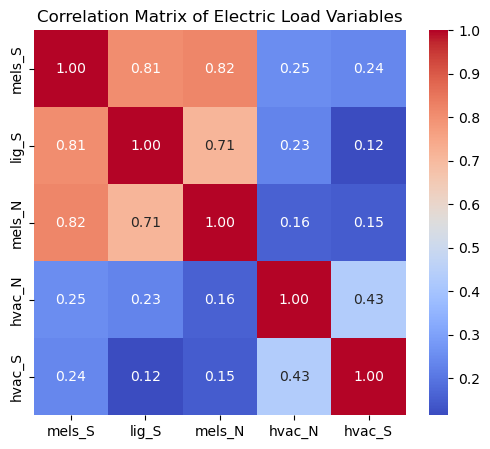

In [73]:
# Corrolation Matrix for all Outputs
# Calculating the correlation matrix
correlation_matrix = data_date[['mels_S', 'lig_S', 'mels_N', 'hvac_N', 'hvac_S' ]].corr()
# Ploting the heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Electric Load Variables')
plt.show()

<Axes: >

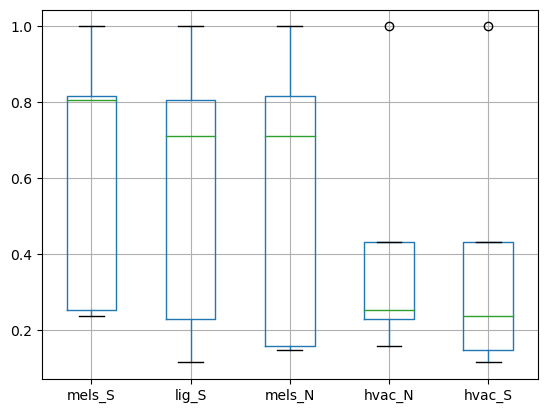

In [74]:
# Plottig Correlation Matrix box plot
correlation_matrix.boxplot()                                         

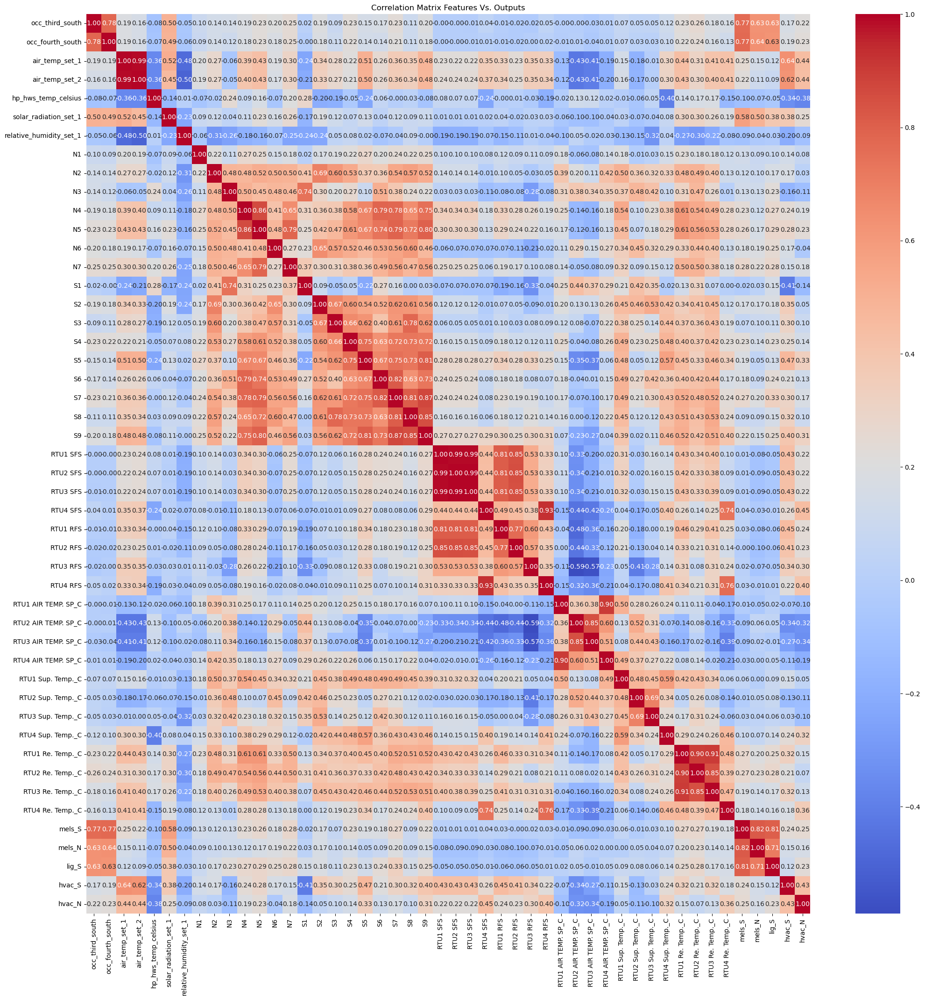

In [75]:
# Corrolation Matrix for all Features and Outputs
# Calculate the correlation matrix
correlation_matrix1 = data_date[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'air_temp_set_2',
'hp_hws_temp_celsius', 'solar_radiation_set_1',  'relative_humidity_set_1', 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 
'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9',  'RTU1 SFS', 'RTU2 SFS', 'RTU3 SFS', 'RTU4 SFS', 'RTU1 RFS', 'RTU2 RFS', 
'RTU3 RFS', 'RTU4 RFS', 'RTU1 AIR TEMP. SP_C', 'RTU2 AIR TEMP. SP_C', 'RTU3 AIR TEMP. SP_C', 'RTU4 AIR TEMP. SP_C',
'RTU1 Sup. Temp._C', 'RTU2 Sup. Temp._C', 'RTU3 Sup. Temp._C', 'RTU4 Sup. Temp._C','RTU1 Re. Temp._C', 
'RTU2 Re. Temp._C', 'RTU3 Re. Temp._C', 'RTU4 Re. Temp._C', 'mels_S', 'mels_N', 'lig_S', 'hvac_S', 'hvac_N',]].corr()

# Plot the heatmap
plt.figure(figsize=(25, 25))
sns.heatmap(correlation_matrix1, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Features Vs. Outputs')
plt.show() 

In [76]:
# Preparing data to have a scatter plot to check the correlation between outputs and inputs
energy = [ 'lig_S', 'hvac_S', 'hvac_N', 'mels_S', 'mels_N']

In [77]:
temp = ['air_temp_set_1', 'solar_radiation_set_1', 'relative_humidity_set_1','N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 'S1', 
'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'hp_hws_temp_celsius']

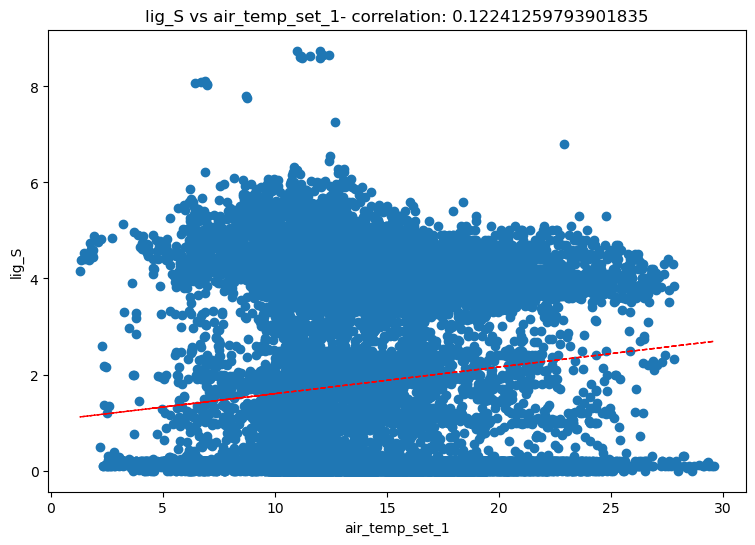

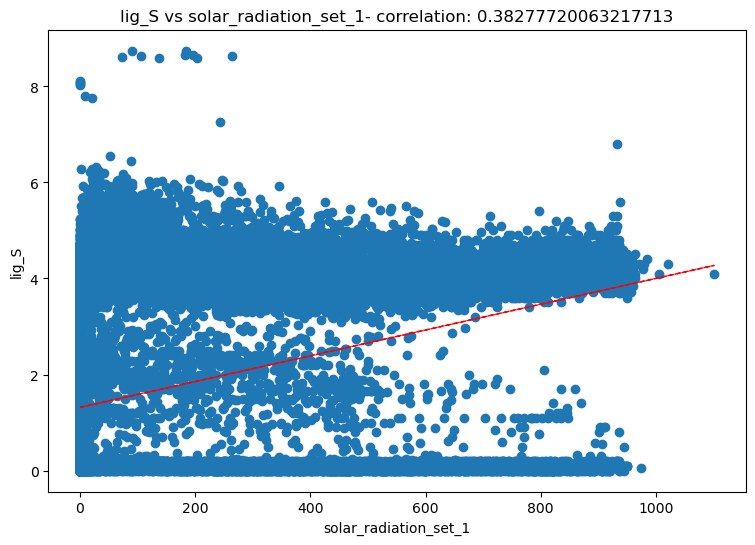

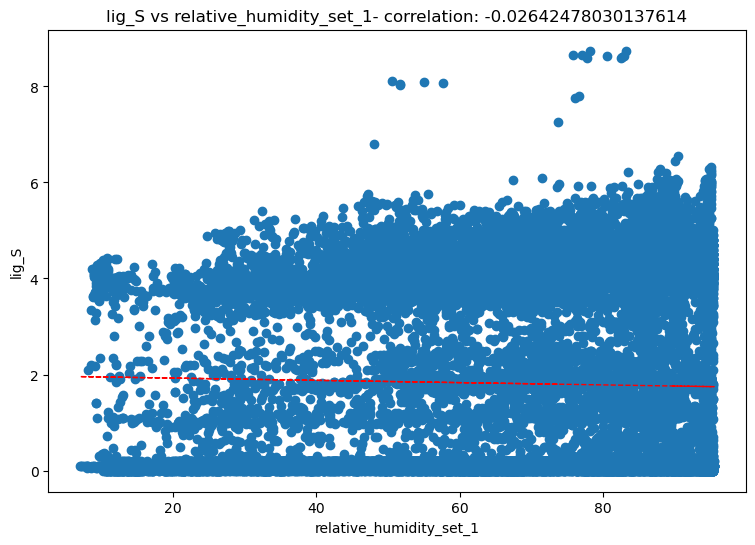

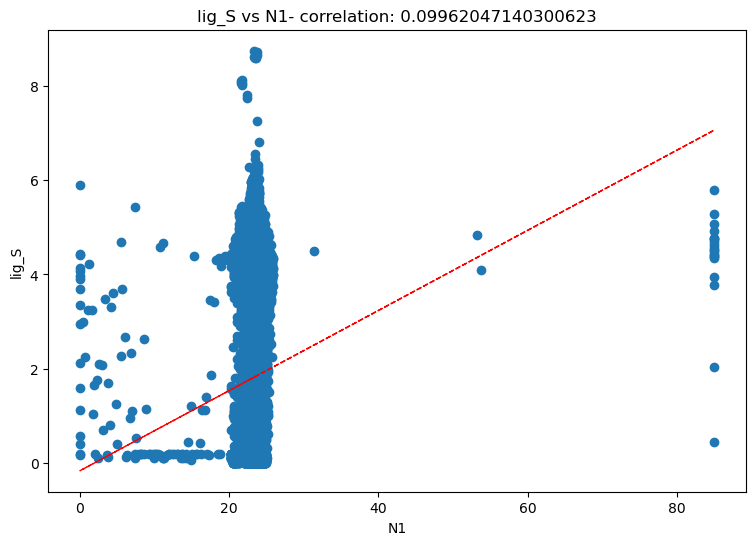

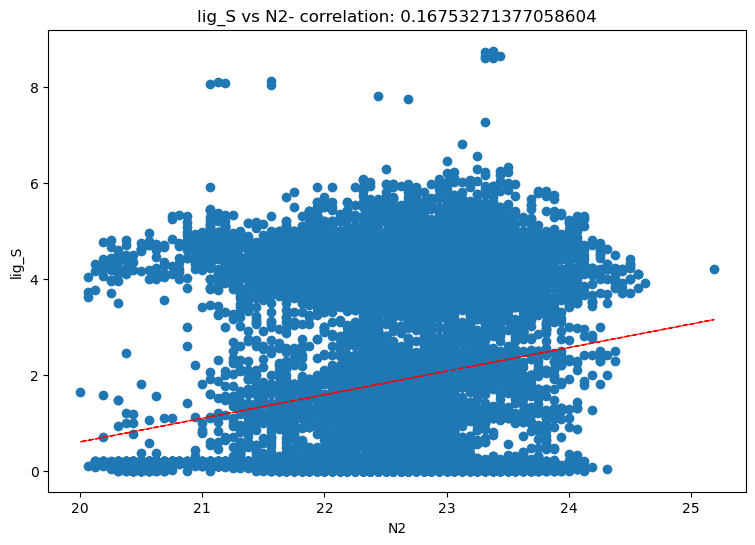

...

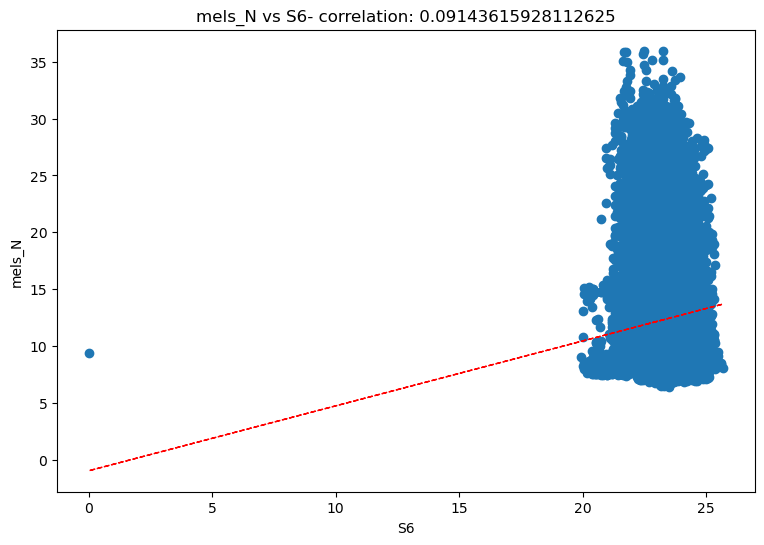

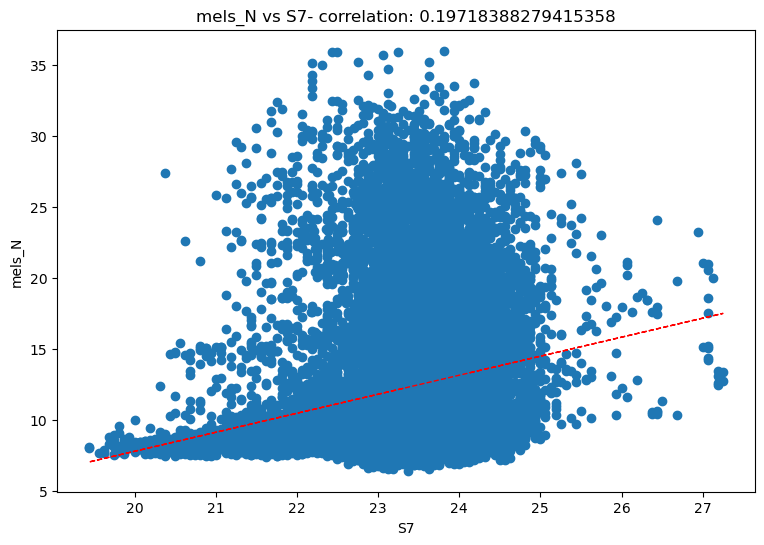

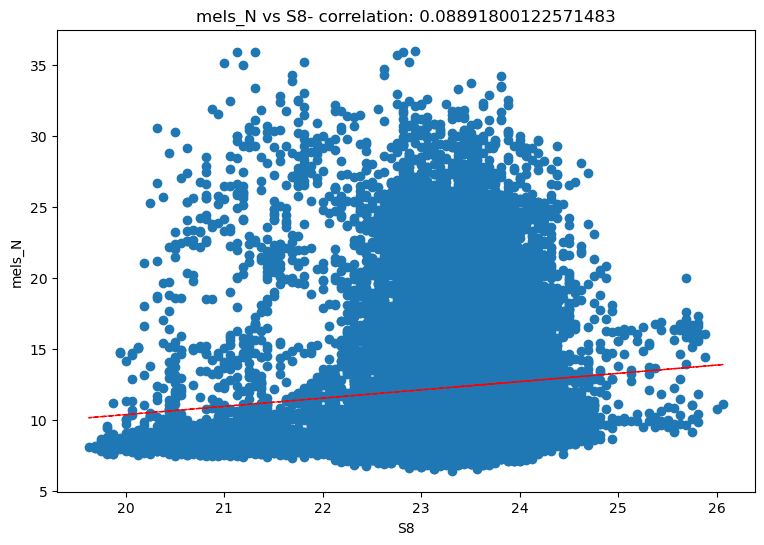

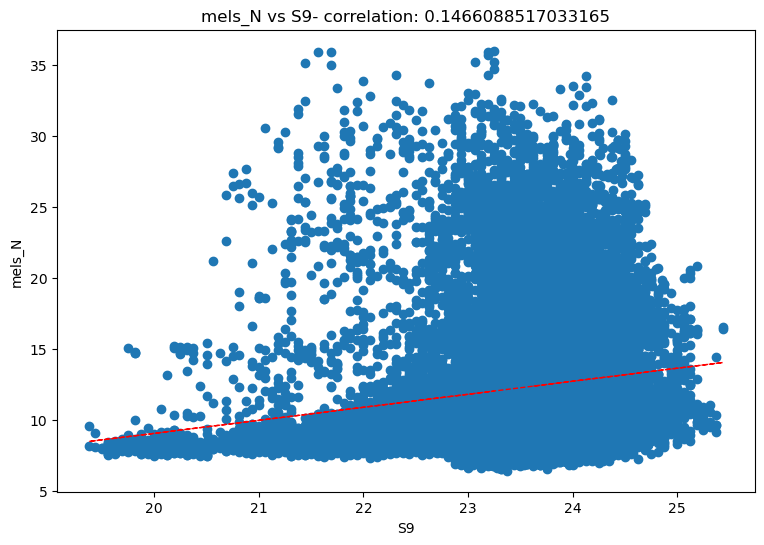

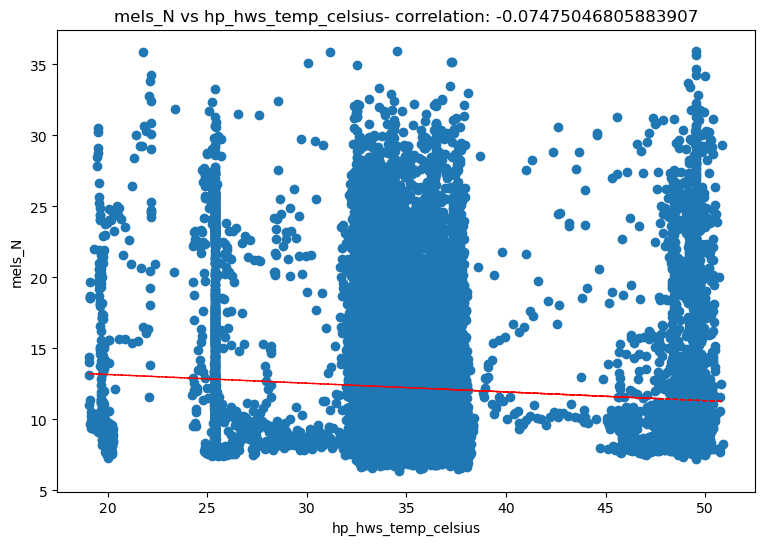

In [78]:
# Plotting a scatter plot to check the correlation between outputs and inputs
for e_col in energy:
    for t_col in temp:
        fig = plt.figure(figsize=(9,6))
        ax = fig.gca()
        feature = data_date[t_col]
        label = data_date[e_col]
        correlation = feature.corr(label)
        plt.scatter(x=feature, y=label)
        plt.xlabel(t_col)
        plt.ylabel(e_col)
        ax.set_title(e_col + ' vs ' + t_col + '- correlation: ' + str(correlation))
        z = np.polyfit(data_date[t_col], data_date[e_col], 1)
        y_hat = np.poly1d(z)(data_date[t_col])

        plt.plot(data_date[t_col], y_hat, "r--", lw=1)

    plt.show()
    gc.collect()

### 4.2.1. Solving Multicolinearity

In [79]:
# Droping data with more than 99% Corrolation
data_final = data_date.drop(['air_temp_set_2', 'Unnamed: 0', 'RTU2 SFS', 'RTU3 SFS'],axis=1)

In [80]:
data_final.to_csv(r'F:\AI Assignment\data_final.csv')
data_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24290 entries, 0 to 24289
Data columns (total 50 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   date                     24290 non-null  object 
 1   mels_S                   24290 non-null  float64
 2   lig_S                    24290 non-null  float64
 3   mels_N                   24290 non-null  float64
 4   hvac_N                   24290 non-null  float64
 5   hvac_S                   24290 non-null  float64
 6   occ_third_south          24290 non-null  float64
 7   occ_fourth_south         24290 non-null  float64
 8   air_temp_set_1           24290 non-null  float64
 9   relative_humidity_set_1  24290 non-null  float64
 10  solar_radiation_set_1    24290 non-null  float64
 11  hp_hws_temp_celsius      24290 non-null  float64
 12  N1                       24290 non-null  float64
 13  N2                       24290 non-null  float64
 14  N3                    

## 4.3. Monthly Graphs

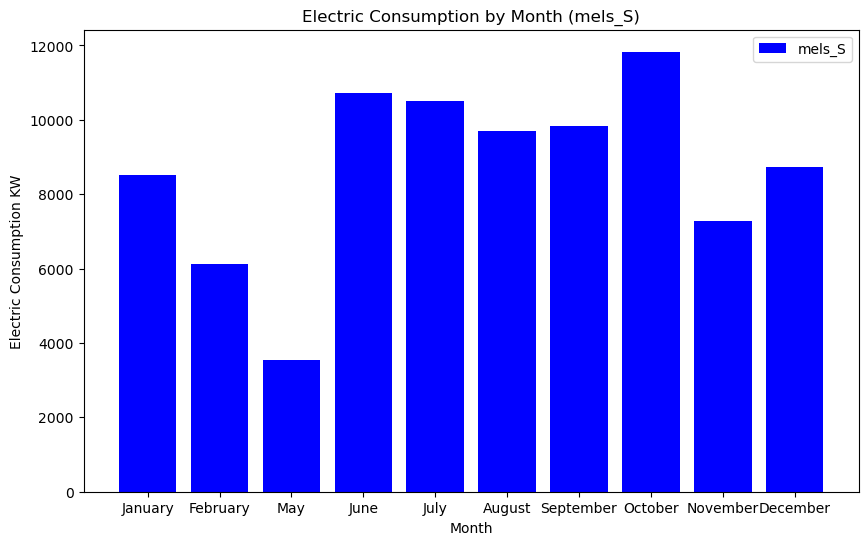

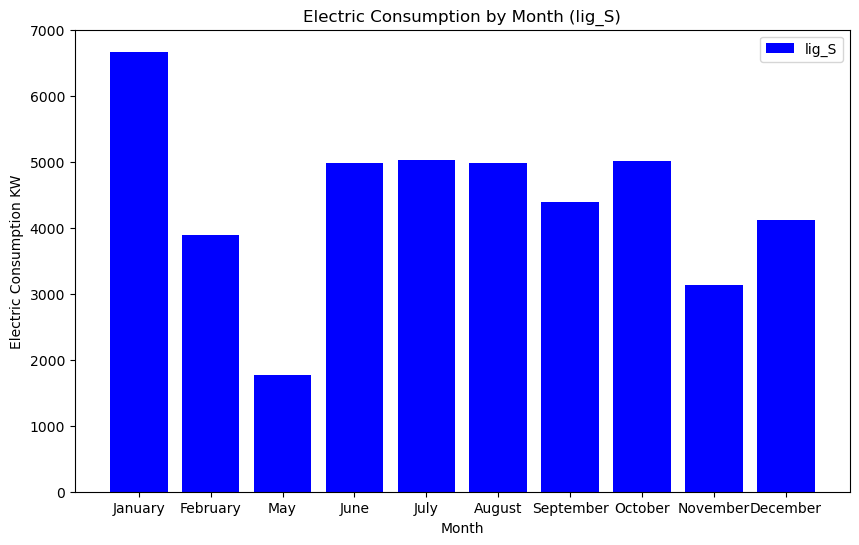

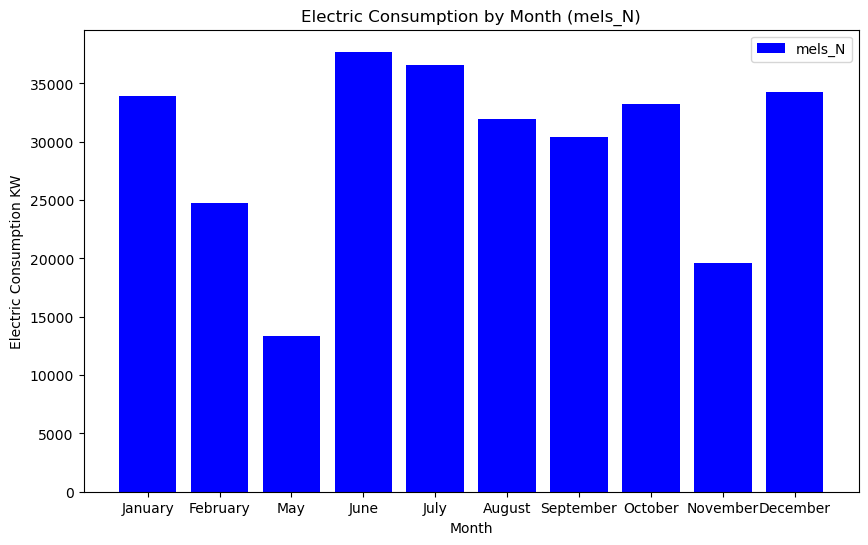

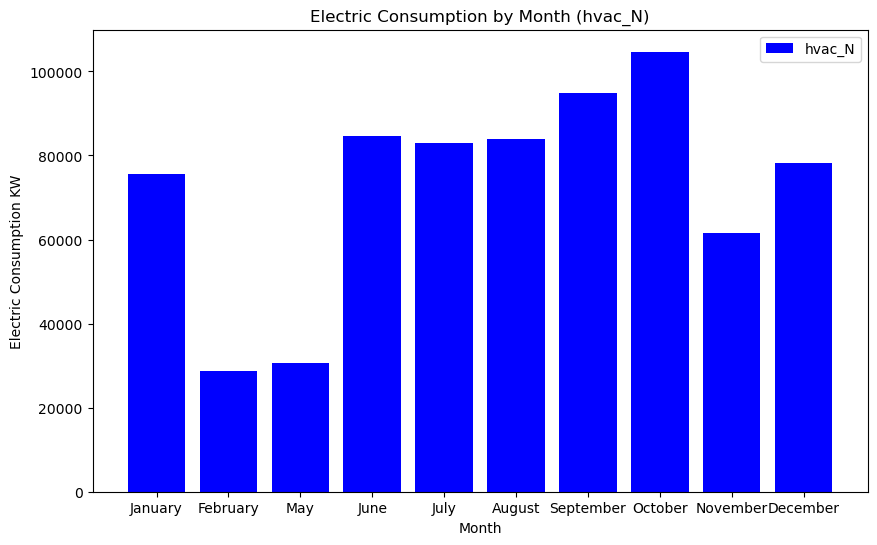

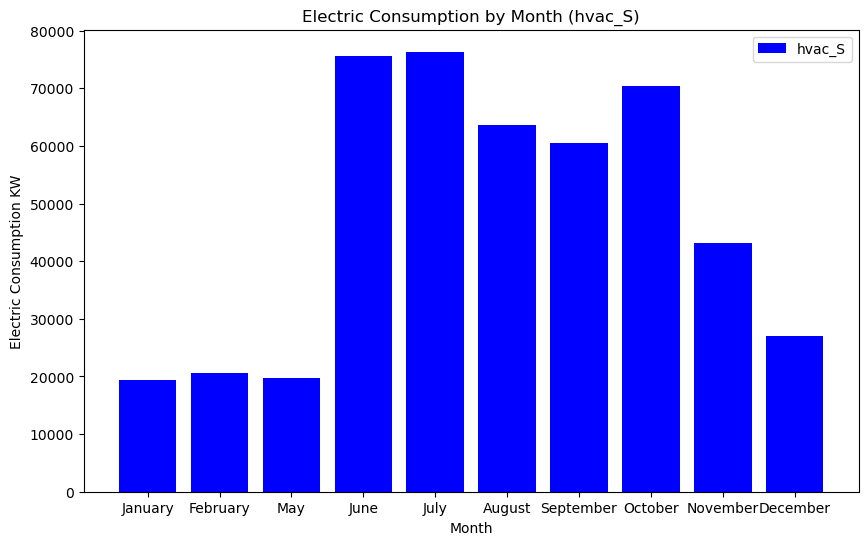

In [81]:
# Preparing data to plot monthly graphs for Mean Electric Consumption
Monthly_data = data_date.groupby(data_date['month'])
# Creating a dictionary to map month names to numbers
month_to_num = {name: num for num, name in enumerate(calendar.month_name) if num}
for col in ['mels_S', 'lig_S', 'mels_N', 'hvac_N', 'hvac_S']:
    # Calculating the sum consumption for each month
    Sum_loads = Monthly_data[col].sum()
    # Convert month names to numbers and sort by the numbers
    sorted_loads = Sum_loads.sort_index(key=lambda x: x.map(month_to_num))
    Months_list = list(sorted_loads.index)
    loads_list = list(sorted_loads)
    plt.figure(figsize=(10, 6))
    plt.bar(Months_list, loads_list, color='blue', label=col)
    plt.xlabel('Month')
    plt.ylabel('Electric Consumption KW')
    plt.title(f'Electric Consumption by Month ({col})')
    plt.legend()
    plt.show()

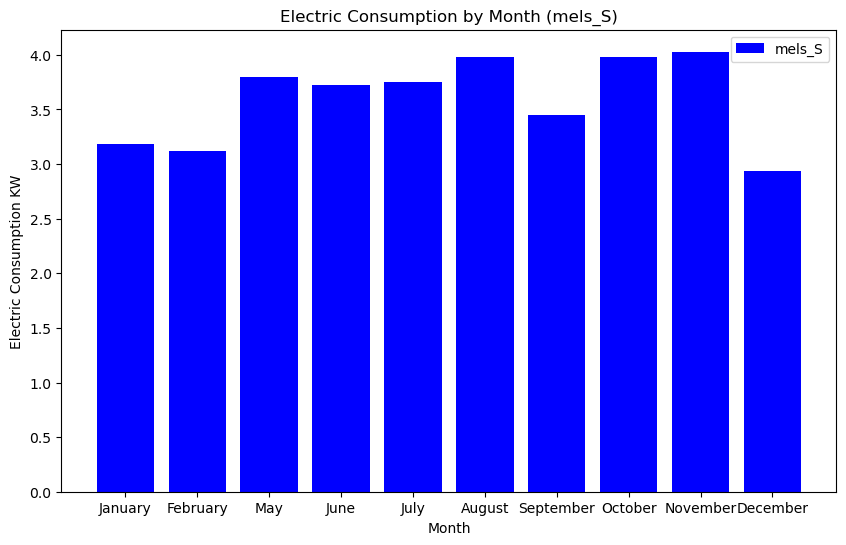

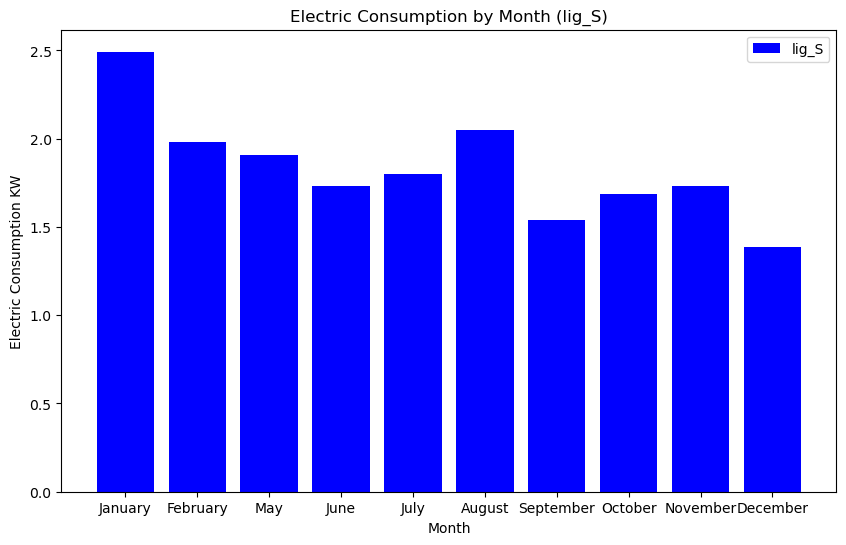

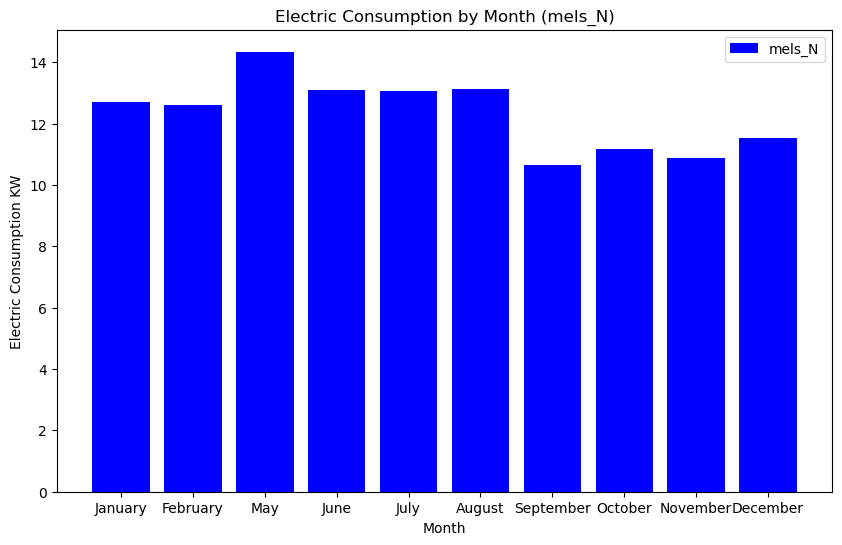

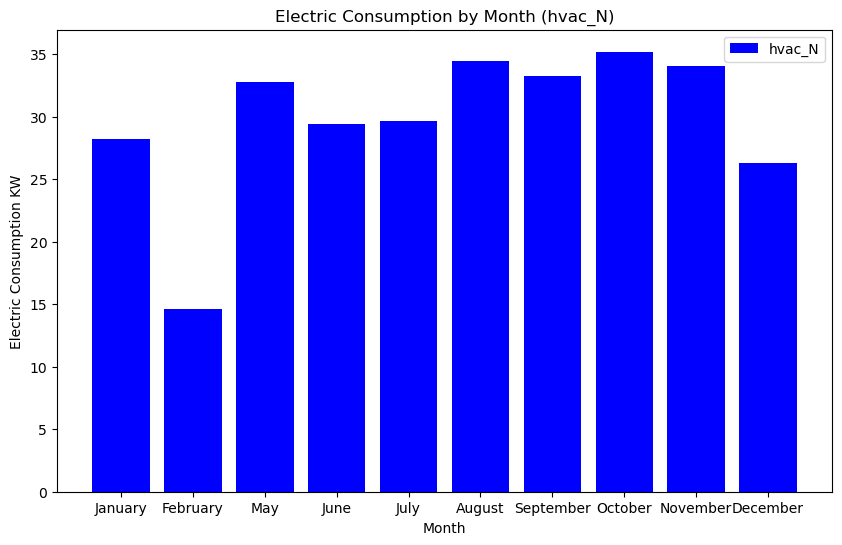

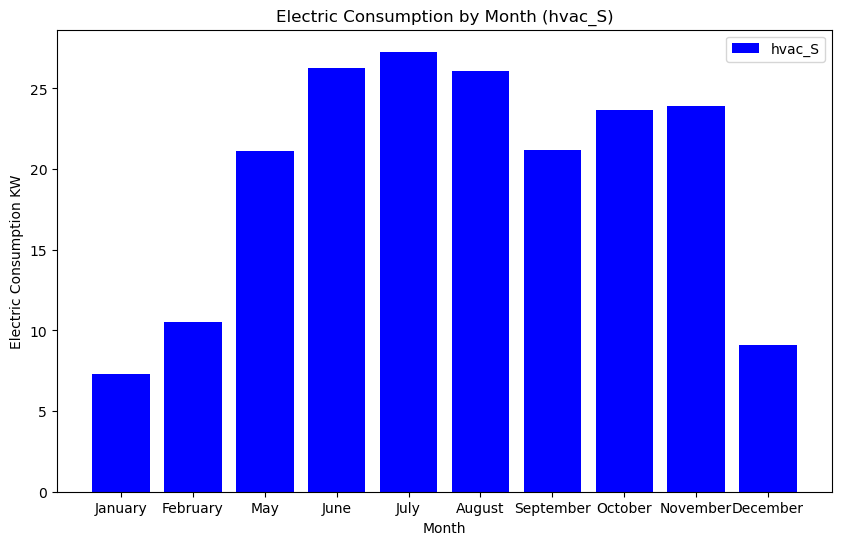

In [82]:
# Preparing data to plot monthly graphs for Mean Electric Consumption
Monthly_data = data_date.groupby(data_date['month'])
# Creating a dictionary to map month names to numbers
month_to_num = {name: num for num, name in enumerate(calendar.month_name) if num}
for col in ['mels_S', 'lig_S', 'mels_N', 'hvac_N', 'hvac_S']:
    # Calculating the mean consumption for each month
    Mean_loads = Monthly_data[col].mean()
    # Convert month names to numbers and sort by the numbers
    sorted_loads = Mean_loads.sort_index(key=lambda x: x.map(month_to_num))
    Months_list = list(sorted_loads.index)
    loads_list = list(sorted_loads)
    plt.figure(figsize=(10, 6))
    plt.bar(Months_list, loads_list, color='blue', label=col)
    plt.xlabel('Month')
    plt.ylabel('Electric Consumption KW')
    plt.title(f'Electric Consumption by Month ({col})')
    plt.legend()
    plt.show()

## 4.4. Weekly Graphs

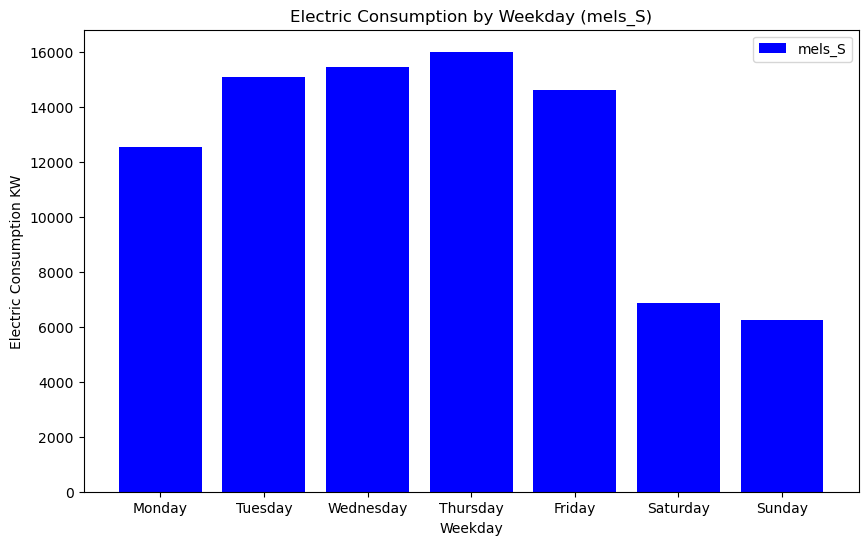

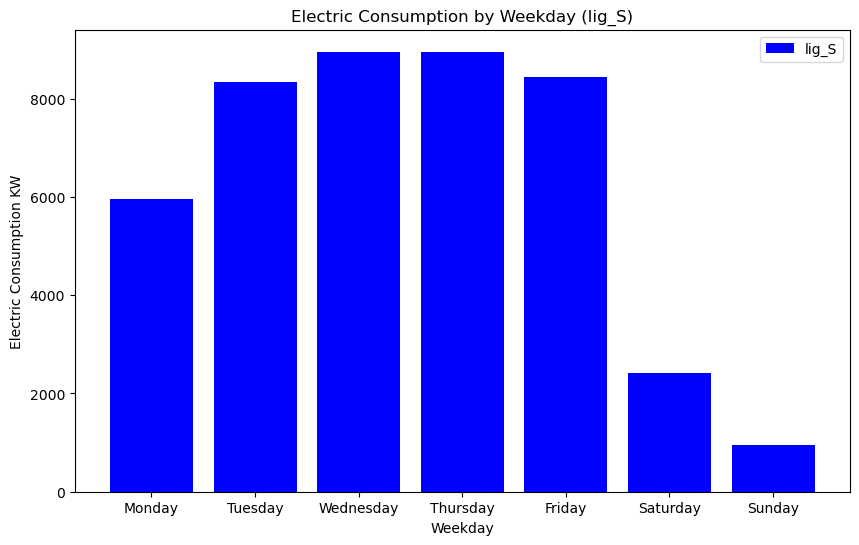

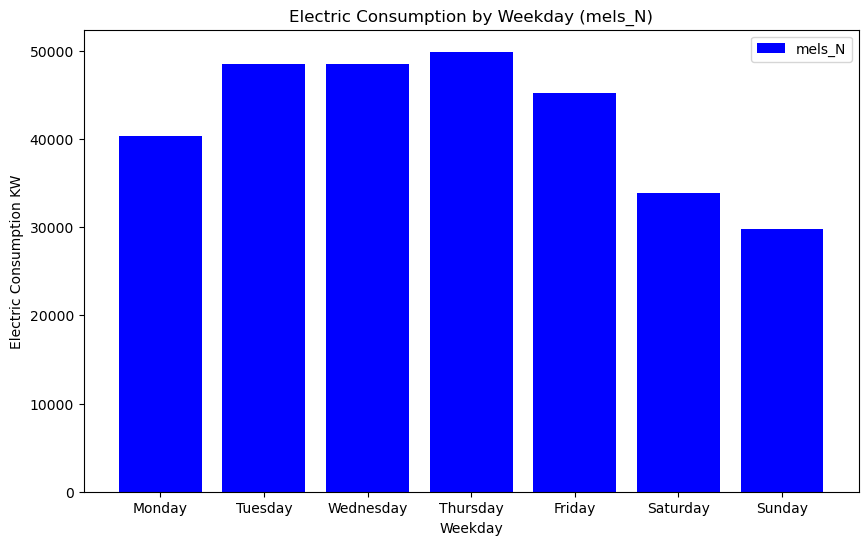

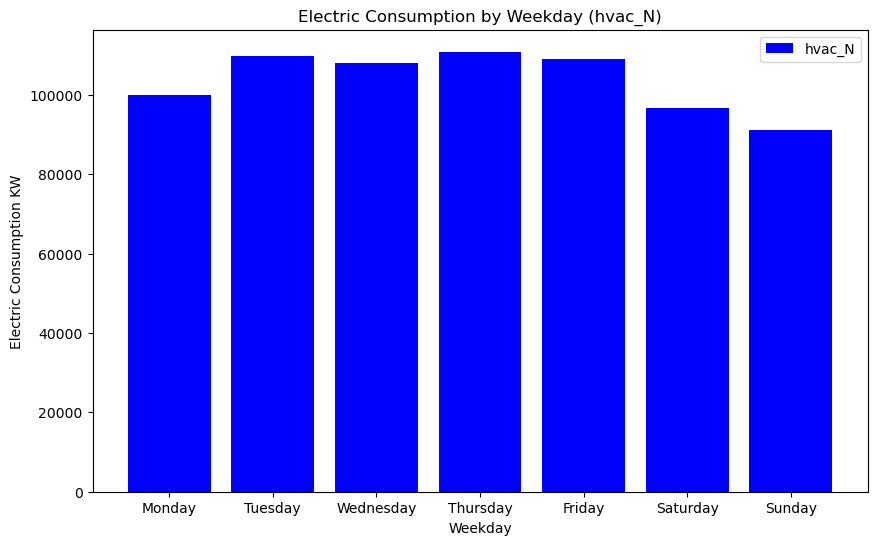

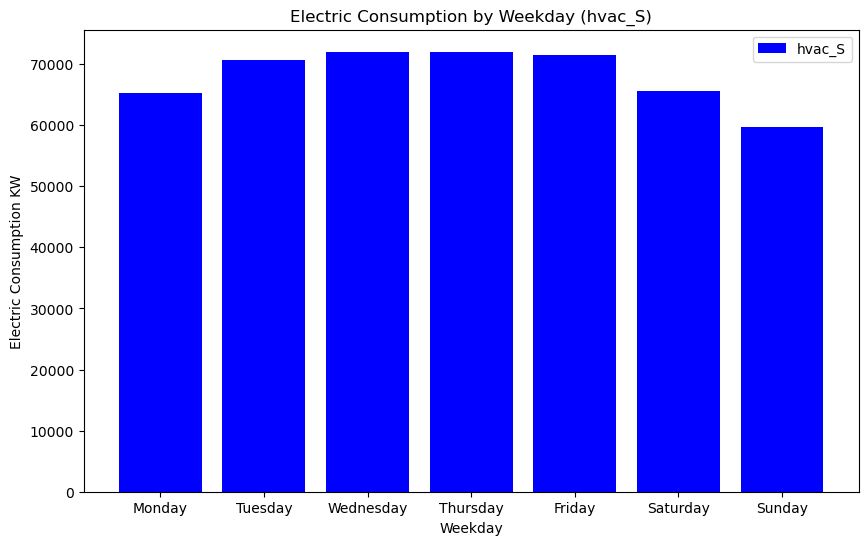

In [83]:
# Preparing data to plot weekly graphs for Cumulative Electric Consumption
# Group the data by weekday
weekly_data = data_date.groupby(data_date['day_of_week'])
# Creating a dictionary to map weekday names to numbers
weekday_to_num = {'Monday': 1, 'Tuesday': 2, 'Wednesday': 3, 'Thursday': 4, 'Friday': 5, 'Saturday': 6, 'Sunday': 7}
for col in ['mels_S', 'lig_S', 'mels_N', 'hvac_N', 'hvac_S']:
    # Calculate the sum electric load for each weekday
    Sum_loads = weekly_data[col].sum()
    # Convert weekday names to numbers and sort by the numbers
    sorted_loads = Sum_loads.sort_index(key=lambda x: x.map(weekday_to_num))
    weekdays_list = list(sorted_loads.index)
    loads_list = list(sorted_loads)
    plt.figure(figsize=(10, 6))
    plt.bar(weekdays_list, loads_list, color='blue', label=col)
    plt.xlabel('Weekday')
    plt.ylabel('Electric Consumption KW')
    plt.title(f'Electric Consumption by Weekday ({col})')
    plt.legend()
    plt.show()

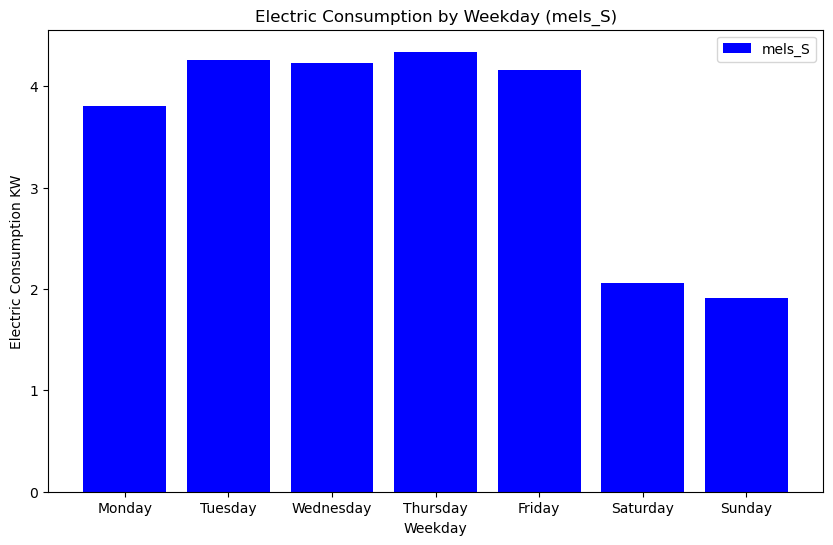

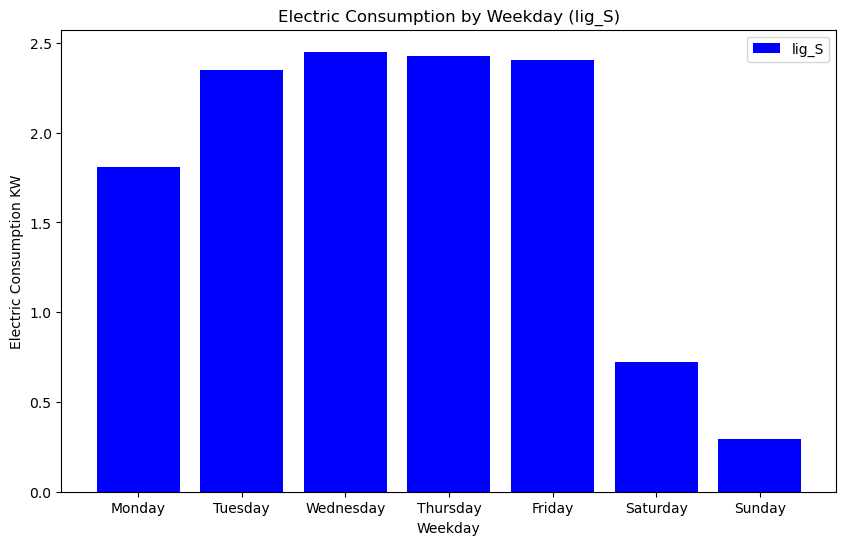

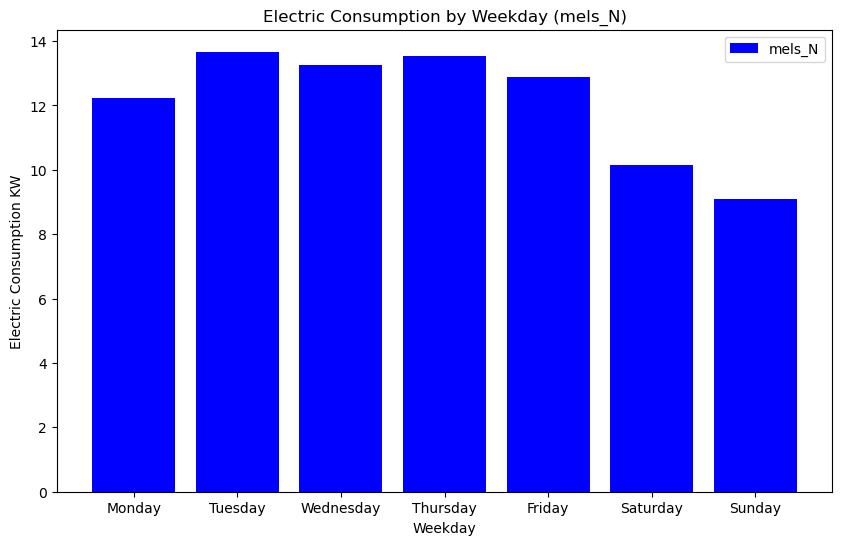

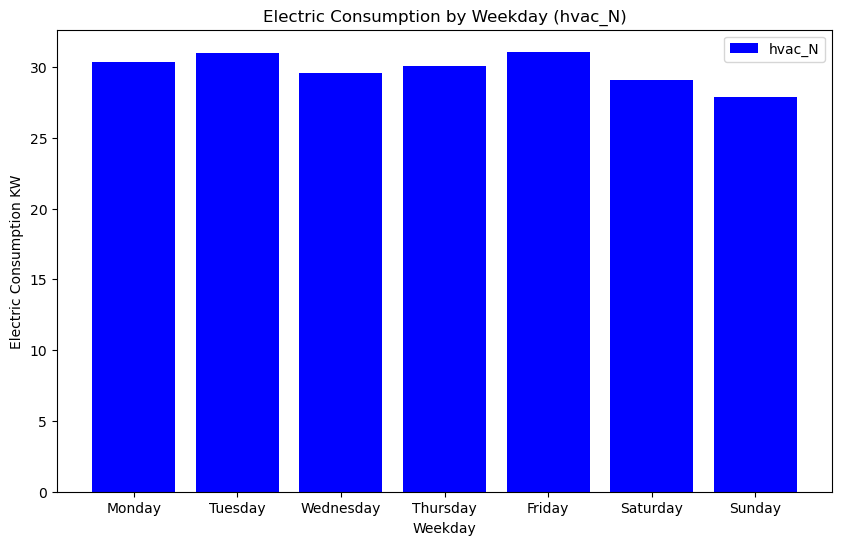

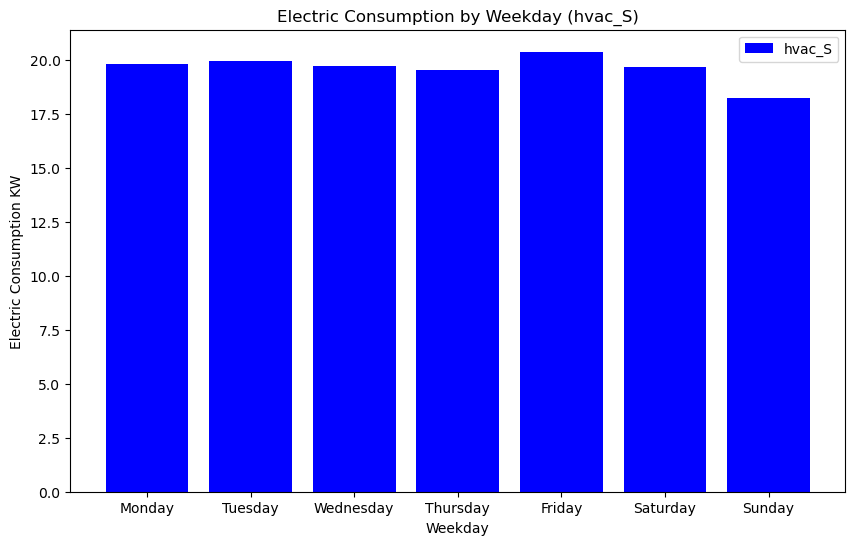

In [84]:
# Preparing data to plot weekly graphs for Cumulative Electric Consumption
# Group the data by weekday
weekly_data = data_date.groupby(data_date['day_of_week'])
# Create a dictionary to map weekday names to numbers
weekday_to_num = {'Monday': 1, 'Tuesday': 2, 'Wednesday': 3, 'Thursday': 4, 'Friday': 5, 'Saturday': 6, 'Sunday': 7}
for col in ['mels_S', 'lig_S', 'mels_N', 'hvac_N', 'hvac_S']:
    # Calculate the Mean electric load for each weekday
    Mean_loads = weekly_data[col].mean()
    # Convert weekday names to numbers and sort by the numbers
    sorted_loads = Mean_loads.sort_index(key=lambda x: x.map(weekday_to_num))
    weekdays_list = list(sorted_loads.index)
    loads_list = list(sorted_loads)
    plt.figure(figsize=(10, 6))
    plt.bar(weekdays_list, loads_list, color='blue', label=col)
    plt.xlabel('Weekday')
    plt.ylabel('Electric Consumption KW')
    plt.title(f'Electric Consumption by Weekday ({col})')
    plt.legend()
    plt.show()

## 4.5. Hourly Graphs

In [85]:
data_final['date'] = pd.to_datetime(data_final['date'])
data_final.set_index('date', inplace=True)
# List of columns to be processed
columns_to_process = ['air_temp_set_1', 'relative_humidity_set_1', 'hp_hws_temp_celsius','N1', 'N2', 'N3', 'N4', 'N5',
'N6', 'N7','S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'RTU1 SFS', 'RTU4 SFS', 'RTU1 RFS', 'RTU2 RFS',  'RTU3 RFS',
'RTU4 RFS','RTU1 AIR TEMP. SP_C', 'RTU2 AIR TEMP. SP_C', 'RTU3 AIR TEMP. SP_C', 'RTU4 AIR TEMP. SP_C','RTU1 Sup. Temp._C', 
'RTU2 Sup. Temp._C', 'RTU3 Sup. Temp._C','RTU4 Sup. Temp._C','RTU1 Re. Temp._C', 'RTU2 Re. Temp._C', 'RTU3 Re. Temp._C', 
'RTU4 Re. Temp._C','day', 'day_of_week', 'month', 'year']
# Extracting the columns before resampling
extracted_columns = {col: data_final[col].resample('H').first() for col in columns_to_process}
data_final1 = data_final.drop(columns=columns_to_process)
# Resampling the data by hour
Hourly_data = data_final1.resample('H').sum()
# Adding the extracted columns back to the DataFrame
for col, data in extracted_columns.items():
    Hourly_data[col] = data
Hourly_data.to_csv(r'F:\\AI Assignment\\Data by Hour.csv')
Hourly_data = pd.read_csv("F:\\AI Assignment\\Data by Hour.csv", index_col='date')
Hourly_data.reset_index(inplace=True)

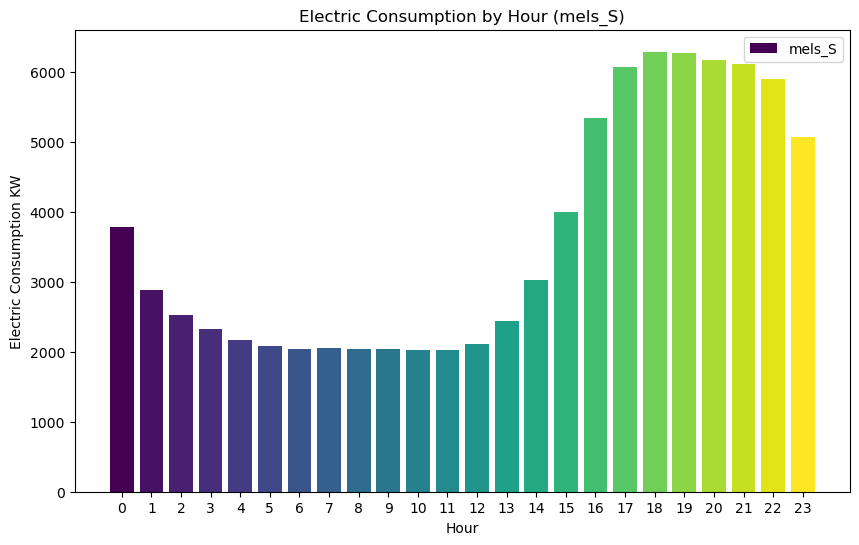

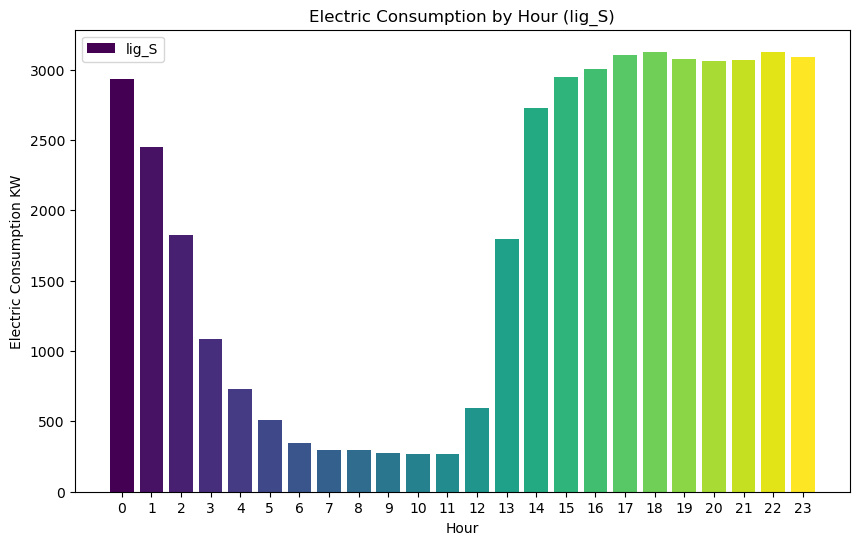

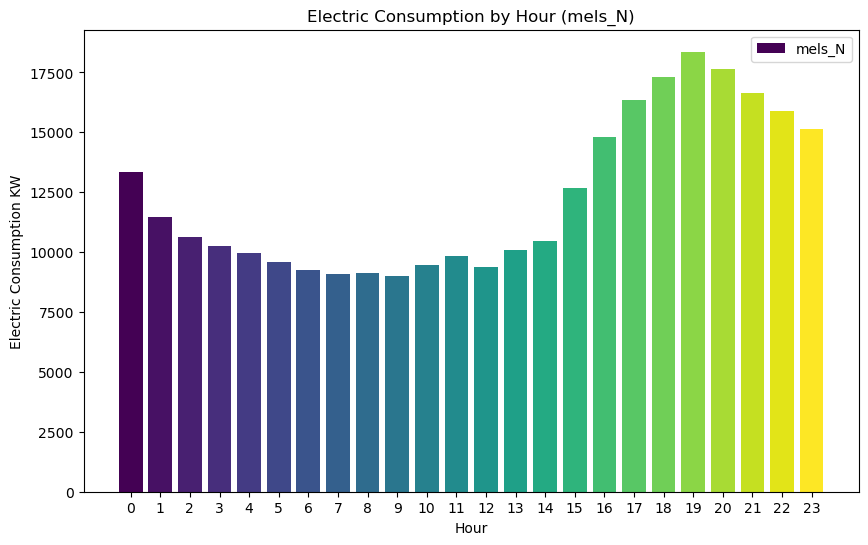

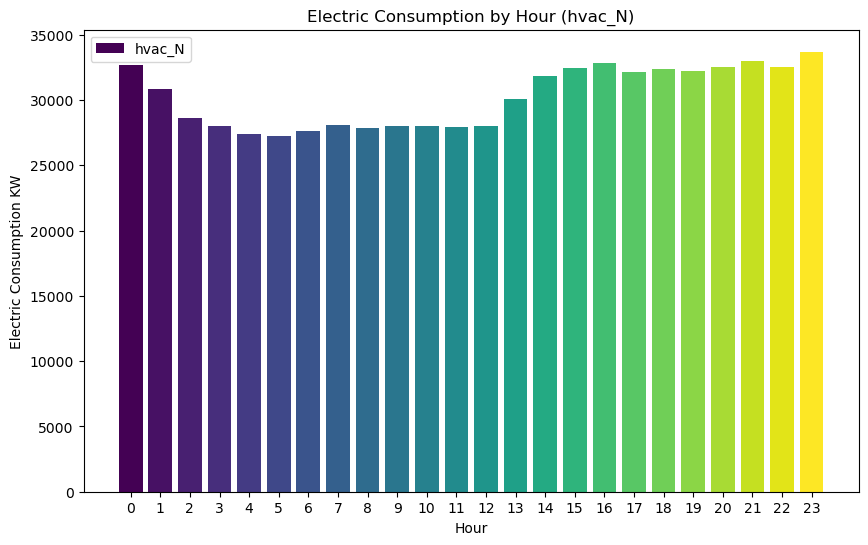

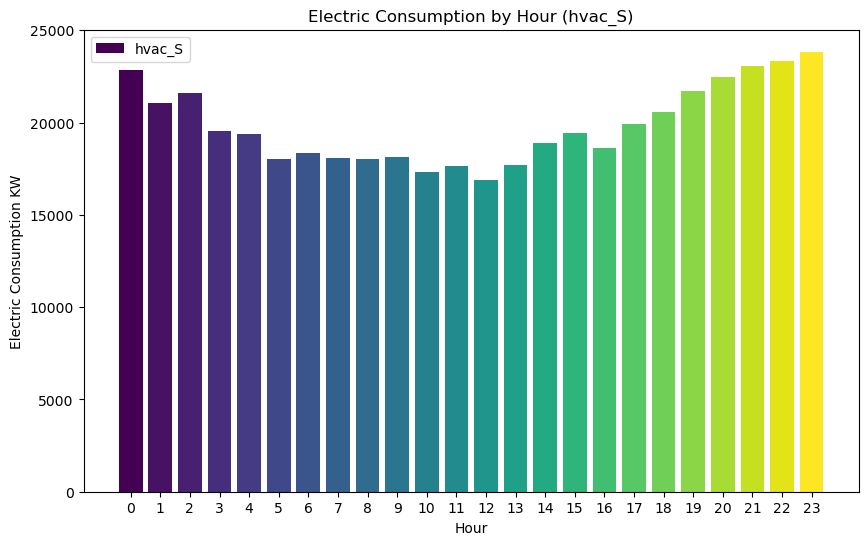

In [86]:
# Preparing data to plot hourly graphs for Cumulative Electric Cunsumption
# Ensure the 'date' column is a datetime type
Hourly_data['date'] = pd.to_datetime(Hourly_data['date'])
# Set the 'date' column as the index
Hourly_data = Hourly_data.set_index('date')
# Grouping the data by hour
hourly_data_grouped = Hourly_data.groupby(Hourly_data.index.hour)
# Creating a list of hours
hours = list(hourly_data_grouped.groups.keys())
colors = plt.cm.viridis(np.linspace(0, 1, 24))
for col in ['mels_S', 'lig_S', 'mels_N', 'hvac_N', 'hvac_S']:
    # Calculating the sum electric load for each hour
    sum_loads = hourly_data_grouped[col].sum()
    hours_list = list(sum_loads.index)
    loads_list = list(sum_loads)
    # Plotting the data
    plt.figure(figsize=(10, 6))
    plt.bar(hours_list, loads_list, color=colors, label=col)
    plt.xlabel('Hour')
    plt.ylabel('Electric Consumption KW')
    plt.title(f'Electric Consumption by Hour ({col})')
    plt.xticks(range(24))  # Set x-ticks to be every hour from 0 to 23
    plt.legend()
    plt.show()

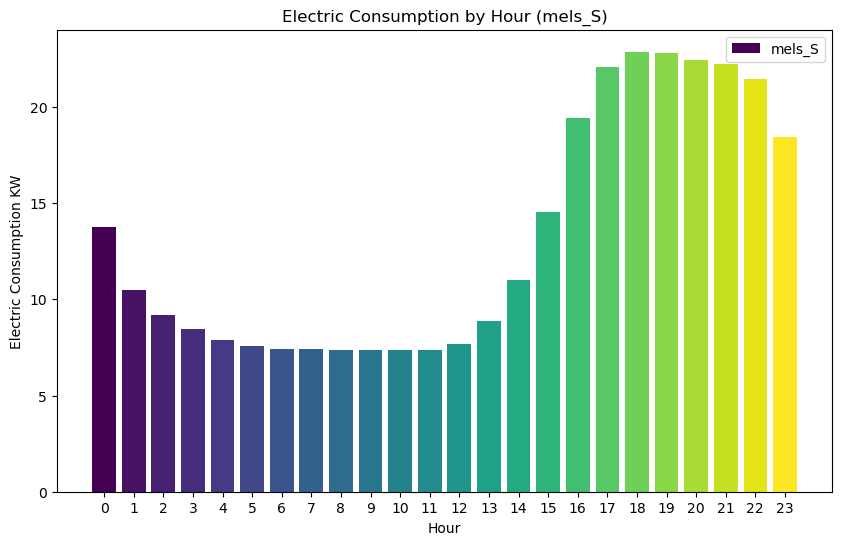

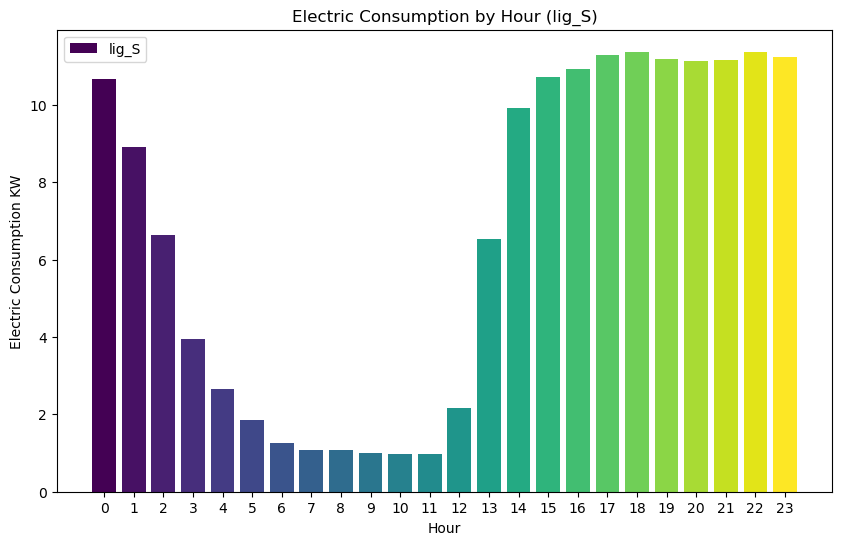

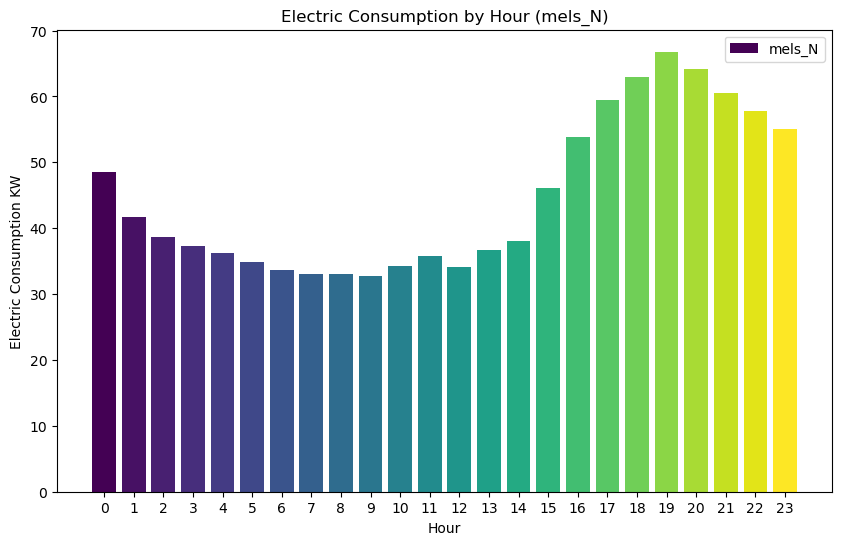

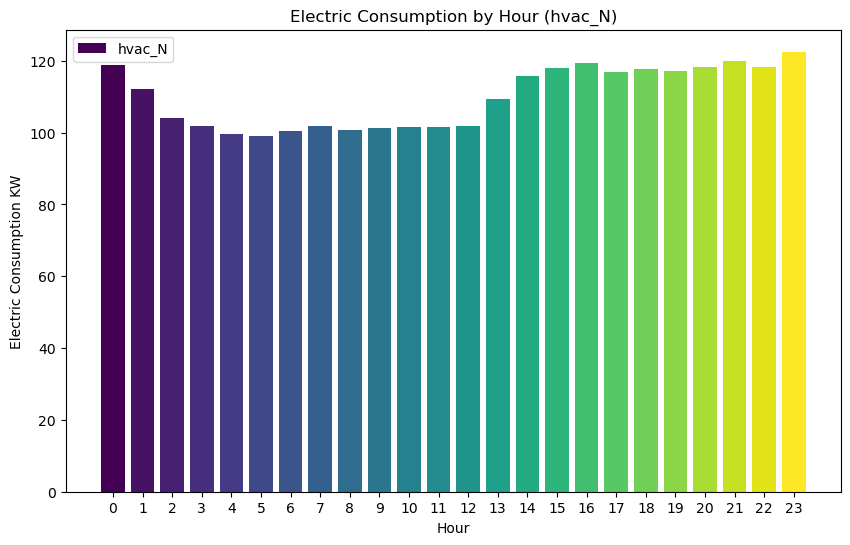

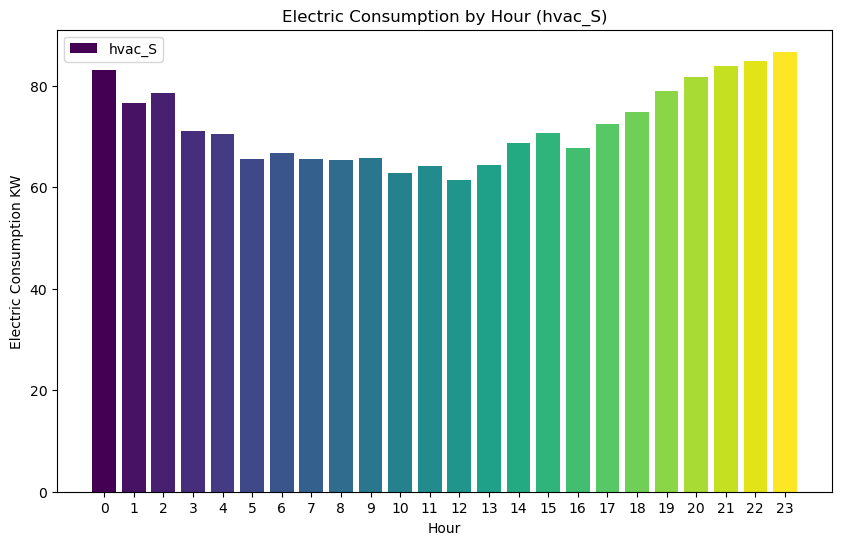

In [87]:
# Preparing data to plot hourly graphs for Mean Electric Cunsumption
hourly_data_grouped = Hourly_data.groupby(Hourly_data.index.hour)
hours = list(hourly_data_grouped.groups.keys())
colors = plt.cm.viridis(np.linspace(0, 1, 24))
for col in ['mels_S', 'lig_S', 'mels_N', 'hvac_N', 'hvac_S']:
    # Calculatimg the mean electric load for each hour
    mean_loads = hourly_data_grouped[col].mean()
    hours_list = list(mean_loads.index)
    loads_list = list(mean_loads)
    plt.figure(figsize=(10, 6))
    plt.bar(hours_list, loads_list, color=colors, label=col)
    plt.xlabel('Hour')
    plt.ylabel('Electric Consumption KW')
    plt.title(f'Electric Consumption by Hour ({col})')
    plt.xticks(range(24))  # Set x-ticks to be every hour from 0 to 23
    plt.legend()
    plt.show()

## 4.6. Histogram Graphs

<Axes: ylabel='Frequency'>

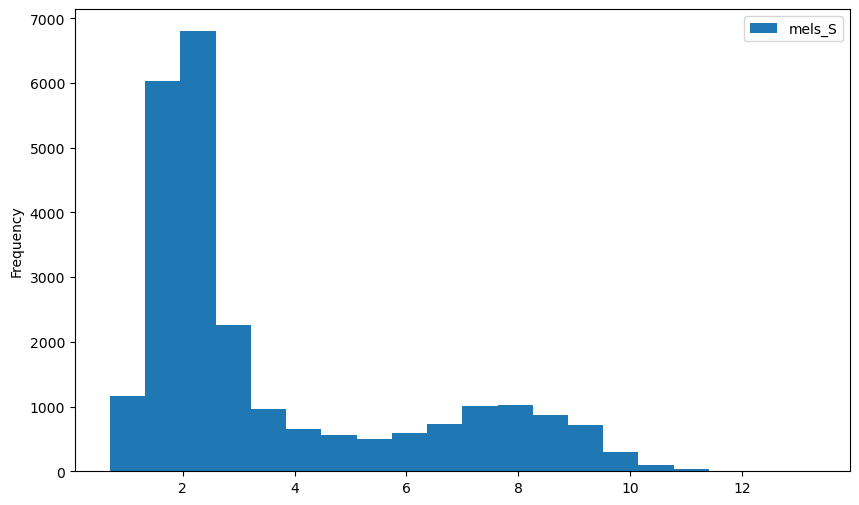

In [88]:
data_date[['mels_S']].plot(kind = 'hist', 
                                bins = 20, 
                                figsize = (10, 6))

<Axes: ylabel='Frequency'>

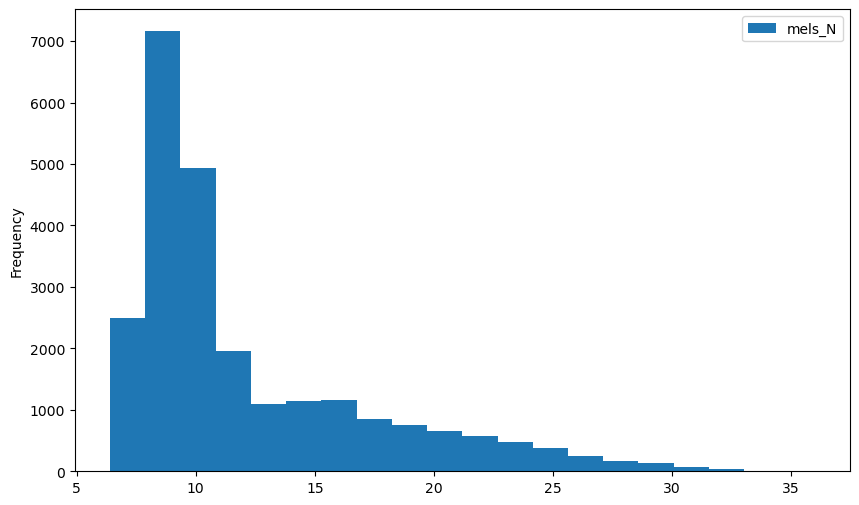

In [89]:
data_date[['mels_N']].plot(kind = 'hist', 
                                bins = 20, 
                                figsize = (10, 6))

<Axes: ylabel='Frequency'>

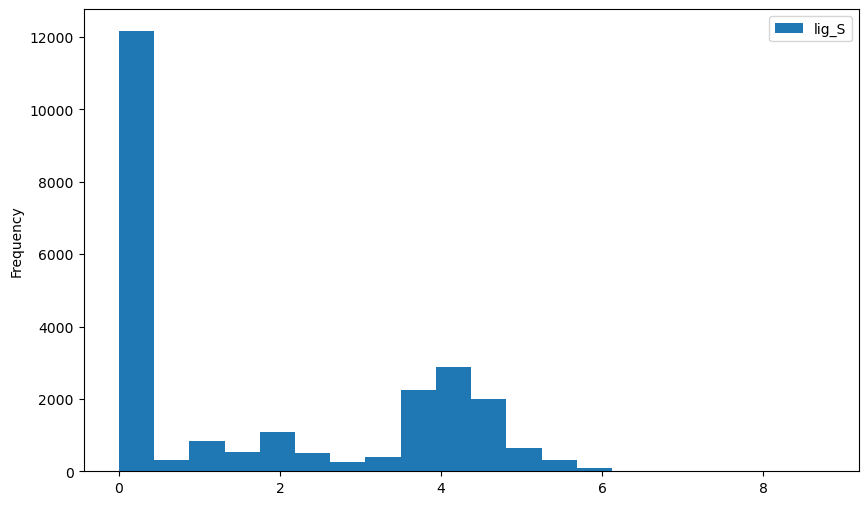

In [90]:
data_date[['lig_S']].plot(kind = 'hist', 
                                bins = 20, 
                                figsize = (10, 6))

<Axes: ylabel='Frequency'>

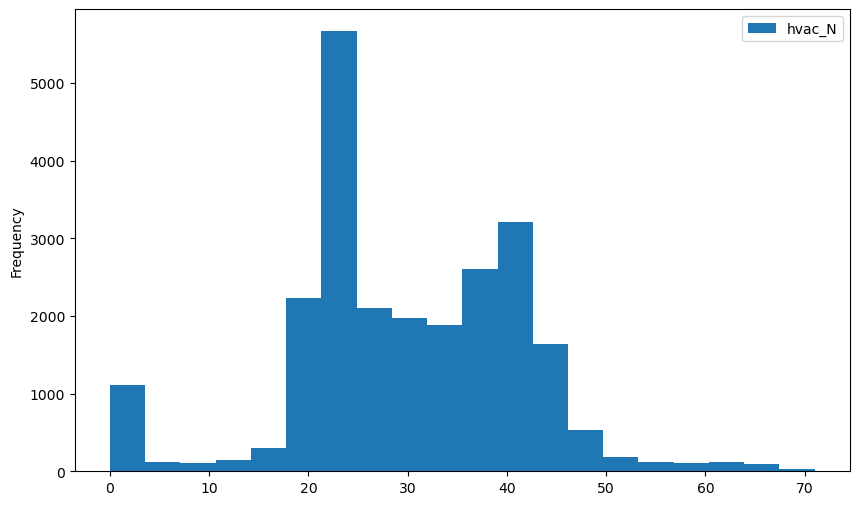

In [91]:
data_date[['hvac_N']].plot(kind = 'hist', 
                                bins = 20, 
                                figsize = (10, 6))

<Axes: ylabel='Frequency'>

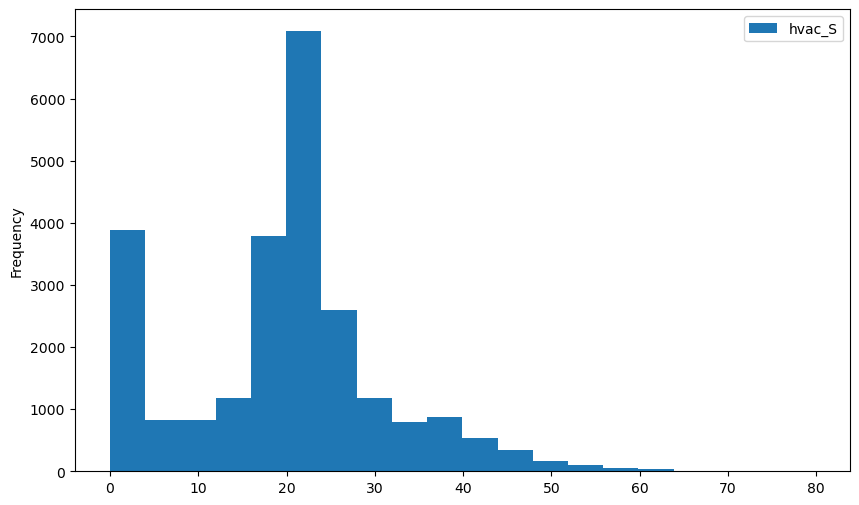

In [92]:
data_date[['hvac_S']].plot(kind = 'hist', 
                                bins = 20, 
                                figsize = (10, 6))

# 5. Regression

## 5.1. Linear Regression

In [93]:
# Codes under this title are commented since different methods are implemented with the same variable names (X,Y).
# In each method/output, different X and Y are used for experimentation.

### 5.1.1. Output1: Miscellaneous electric load for the South Wing (mels_S)

In [94]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius','hvac_N', 'lig_S', 'mels_N', 'hvac_S',
#                 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9']]

# # # Using only corrolated features as inputs:
# # X = data_final[['occ_third_south', 'occ_fourth_south', 'solar_radiation_set_1']]

# Y = data_final['mels_S']

# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create and train the model
# model = LinearRegression()
# model.fit(X_train, Y_train)

# # Make predictions
# Y_pred = model.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.8758949173117988
MEA is 0.6526195362817578
MSE is 0.7718912178624954
RMSE is 0.8785733992458998


### 5.1.2. Output2: Miscellaneous electric load for the North Wing (mels_N)

In [95]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius', 
#                 'hvac_N', 'lig_S', 'mels_S', 'hvac_S', 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7']]

# # # Using only corrolated features as inputs:
# # X = data_final[['occ_third_south', 'occ_fourth_south', 'solar_radiation_set_1']]

# Y = data_final['mels_N']

# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create and train the model
# model = LinearRegression()
# model.fit(X_train, Y_train)

# # Make predictions
# Y_pred = model.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.6842490244295305
MEA is 2.0212471350655035
MSE is 8.105676798708203
RMSE is 2.8470470313481306


### 5.1.3. Output3: Lighting load for the South Wing (lig_S)

In [96]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius',  
#                 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'hvac_N', 'mels_N', 'mels_S', 'hvac_S']]

# # # Using only corrolated features as inputs:
# # X = data_final[['occ_third_south', 'occ_fourth_south', 'solar_radiation_set_1']]

# Y = data_final['lig_S']

# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create and train the model
# model = LinearRegression()
# model.fit(X_train, Y_train)

# # Make predictions
# Y_pred = model.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.7087266996161969
MEA is 0.7890901604394237
MSE is 1.0430064037724727
RMSE is 1.0212768497192486


### 5.1.4. Output4: Heating Ventilation and Air Conditioning load for the Sorth Wing (hvac_S)

In [97]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'hp_hws_temp_celsius', 
#                                  'solar_radiation_set_1',  'relative_humidity_set_1', 
#                 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 'hvac_N', 'mels_N', 'mels_S', 'lig_S']]

# # # Using only corrolated features as inputs:
# # X = data_final[['air_temp_set_1', 'solar_radiation_set_1']]

# Y = data_final['hvac_S']

# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create and train the model
# model = LinearRegression()
# model.fit(X_train, Y_train)

# # Make predictions
# Y_pred = model.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.4795762031326153
MEA is 6.2009551953172934
MSE is 73.98360616125298
RMSE is 8.601372341740182


### 5.1.5. Output5: Heating Ventilation and Air Conditioning load for the Sorth Wing (hvac_N)

In [98]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'hp_hws_temp_celsius', 
#                  'solar_radiation_set_1',  'relative_humidity_set_1', 
#                 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 'hvac_S', 'mels_N', 'mels_S', 'lig_S']]

# # # Using only corrolated features as inputs:
# # X = data_final[['air_temp_set_1','solar_radiation_set_1']]

# Y = data_final['hvac_N']

# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create and train the model
# model = LinearRegression()
# model.fit(X_train, Y_train)

# # Make predictions
# Y_pred = model.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.3820232627472798
MEA is 7.577583628420327
MSE is 87.70763503422583
RMSE is 9.365235450015437


### 5.1.6. Output1 for Work Days Reg.

In [99]:
# Ommiting "Saturdays" and "Sundays", as the power consumptions are significatly lower than other days.
workdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
workdays = data_final[data_final['day_of_week'].isin(workdays)]

In [100]:
workdays.to_csv(r'F:\AI Assignment\workdays.csv')

In [101]:
# Assume 'X' contains features (inputs) and 'Y' is the target (output)
X = workdays[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
              'solar_radiation_set_1', 'hp_hws_temp_celsius']]
Y = workdays['mels_S']

In [102]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [104]:
# # Create and train the model
# model = LinearRegression()
# model.fit(X_train, Y_train)

# # Make predictions
# Y_pred = model.predict(X_test)
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.7114849519254156
MEA is 1.0156980394419044
MSE is 2.051585207467893
RMSE is 1.4323355778126483


## 5.2. Random Forest Regression

In [105]:
# Codes under this title are commented since different methods are implemented with the same variable names (X,Y).
# In each method/output, different X and Y are used for experimentation.

### 5.2.1. Output1: Miscellaneous electric load for the South Wing (mels_S)

In [106]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)

# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius']]


# # # Using only corrolated features as inputs:
# # X = data_final[['occ_third_south', 'occ_fourth_south', 'solar_radiation_set_1']]

# Y = data_final['mels_S']

# # Split the dataset into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Initialize the Random Forest Regressor
# rf_regressor = RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)

# # Fit the model to the training data
# rf_regressor.fit(X_train, Y_train)

# # Make predictions on the test set
# Y_pred = rf_regressor.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.9073425795253479
MEA is 0.4655863072299474
MSE is 0.5762975019634399
RMSE is 0.7591426097667288


### 5.2.2. Output2: Miscellaneous electric load for the North Wing (mels_N)

In [107]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius','N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7']]

# # # Using only corrolated features as inputs:
# # X = data_final[['occ_third_south', 'occ_fourth_south', 'solar_radiation_set_1']]

# Y = data_final['mels_N']

# # Split the dataset into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Initialize the Random Forest Regressor
# rf_regressor = RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)

# # Fit the model to the training data
# rf_regressor.fit(X_train, Y_train)

# # Make predictions on the test set
# Y_pred = rf_regressor.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.8412601953711067
MEA is 1.307521117022035
MSE is 4.075026368761695
RMSE is 2.018669455052435


### 5.2.3. Output3: Lighting load for the South Wing (lig_S)

In [108]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1',
#    'solar_radiation_set_1', 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9']]

# # # Using only corrolated features as inputs:
# # X = data_final[['occ_third_south', 'occ_fourth_south', 'solar_radiation_set_1']]

# Y = data_final['lig_S']

# # Split the dataset into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Initialize the Random Forest Regressor
# rf_regressor = RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)

# # Fit the model to the training data
# rf_regressor.fit(X_train, Y_train)

# # Make predictions on the test set
# Y_pred = rf_regressor.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.9002135691606837
MEA is 0.3252906395408208
MSE is 0.357320379993172
RMSE is 0.5977628124876723


### 5.2.4. Output4: Heating Ventilation and Air Conditioning load for the Sorth Wing (hvac_S)

In [109]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1',
# 'solar_radiation_set_1', 'hp_hws_temp_celsius', 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9','RTU1 SFS', 'RTU4 SFS',
# 'RTU1 RFS', 'RTU2 RFS',  'RTU3 RFS','RTU4 RFS', 'hvac_N', 'lig_S', 'mels_N', 'mels_S',]]

# # # Using only corrolated features as inputs:
# # X = data_final[['air_temp_set_1', 'solar_radiation_set_1']]

# Y = data_final['hvac_S']

# # Split the dataset into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Initialize the Random Forest Regressor
# rf_regressor = RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)

# # Fit the model to the training data
# rf_regressor.fit(X_train, Y_train)

# # Make predictions on the test set
# Y_pred = rf_regressor.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.7710969562657225
MEA is 3.565440957955506
MSE is 32.5409267191221
RMSE is 5.704465506874601


### 5.2.5. Output5: Heating Ventilation and Air Conditioning load for the Sorth Wing (hvac_N)

In [110]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius', 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', ]]
# Y = data_final['hvac_N']

# # Split the dataset into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Initialize the Random Forest Regressor
# rf_regressor = RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)

# # Fit the model to the training data
# rf_regressor.fit(X_train, Y_train)

# # Make predictions on the test set
# Y_pred = rf_regressor.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.7267507586910182
MEA is 4.2127709362010615
MSE is 38.781467465346395
RMSE is 6.227476813714074


## 5.3. Support Vector Regression
#### Compileing takes long time 

In [113]:
# Codes under this title are commented since different methods are implemented with the same variable names (X,Y).
# In each method/output, different X and Y are used for experimentation.

### 5.3.1. Output1: Miscellaneous electric load for the South Wing (mels_S)

In [114]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius']]
# Y = data_final['mels_S']
# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

#### Applying "Grid Search" to find the best hyperparameters

# # Create an SVR object
# svr_model = svm.SVR(kernel='linear', C=1, epsilon=0.5)

# # Train the model using the training data
# svr_model.fit(X_train, Y_train)

# # Make predictions on the testing data
# Y_pred = svr_model.predict(X_test)

## 5.4. Gradient Boosting Regression 

In [115]:
# Codes under this title are commented since different methods are implemented with the same variable names (X,Y).
# In each method/output, different X and Y are used for experimentation.

### 5.4.1. Output1: Miscellaneous electric load for the South Wing (mels_S)

In [116]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius','hvac_N', 'lig_S', 'mels_N', 'hvac_S',
#                 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9']]
# Y = data_final['mels_S']

# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create a GradientBoostingRegressor object
# gbr = GradientBoostingRegressor(n_estimators=5000, learning_rate=0.1, max_depth=4, random_state=42, loss='squared_error')

# # Fit the model to the training data
# gbr.fit(X_train, Y_train)

# # Use the model to predict the test set
# Y_pred = gbr.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.9641561704047295
MEA is 0.3118642640908095
MSE is 0.22293637520600523
RMSE is 0.4721613868223504


### 5.4.2. Output2: Miscellaneous electric load for the North Wing (mels_N)

In [117]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius', 
#                 'hvac_N', 'lig_S', 'mels_S', 'hvac_S', 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7']]
# Y = data_final['mels_N']

# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create a GradientBoostingRegressor object
# gbr = GradientBoostingRegressor(n_estimators=5000, learning_rate=0.1, max_depth=4, random_state=42, loss='squared_error')

# # Fit the model to the training data
# gbr.fit(X_train, Y_train)

# # Use the model to predict the test set
# Y_pred = gbr.predict(X_test)
# # Evaluation
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.8426233151815328
MEA is 1.3453257643192291
MSE is 4.040033575465436
RMSE is 2.009983476416022


### 5.4.3. Output3: Lighting load for the South Wing (lig_S)

In [118]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius',  
#                 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'hvac_N', 'mels_N', 'mels_S', 'hvac_S']]
# Y = data_final['lig_S']

# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create a GradientBoostingRegressor object
# gbr = GradientBoostingRegressor(n_estimators=5000, learning_rate=0.1, max_depth=4, random_state=42, loss='squared_error')

# # Fit the model to the training data
# gbr.fit(X_train, Y_train)

# # Use the model to predict the test set
# Y_pred = gbr.predict(X_test)
# # Evaluation
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.9161195908247677
MEA is 0.33561461626344147
MSE is 0.3003632801411673
RMSE is 0.5480540850510717


### 5.4.4. Output4: Heating Ventilation and Air Conditioning load for the Sorth Wing (hvac_S)

In [119]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1',
# 'solar_radiation_set_1', 'hp_hws_temp_celsius', 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9','RTU1 SFS', 'RTU4 SFS',
# 'RTU1 RFS', 'RTU2 RFS',  'RTU3 RFS','RTU4 RFS', 'hvac_N', 'lig_S', 'mels_N', 'mels_S',]]
# Y = data_final['hvac_S']

# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create a GradientBoostingRegressor object
# gbr = GradientBoostingRegressor(n_estimators=5000, learning_rate=0.1, max_depth=4, random_state=42, loss='squared_error')

# # Fit the model to the training data
# gbr.fit(X_train, Y_train)

# # Use the model to predict the test set
# Y_pred = gbr.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.744686363703033
MEA is 3.8139421767547494
MSE is 36.29546463688232
RMSE is 6.0245717388775715


### 5.4.5. Output5: Heating Ventilation and Air Conditioning load for the Sorth Wing (hvac_N)

In [120]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'hp_hws_temp_celsius', 
#                  'solar_radiation_set_1',  'relative_humidity_set_1', 
#                 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 'hvac_S', 'mels_N', 'mels_S', 'lig_S']]
# Y = data_final['hvac_N']

# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create a GradientBoostingRegressor object
# gbr = GradientBoostingRegressor(n_estimators=5000, learning_rate=0.1, max_depth=4, random_state=42, loss='squared_error')

# # Fit the model to the training data
# gbr.fit(X_train, Y_train)

# # Use the model to predict the test set
# Y_pred = gbr.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.7124476969682199
MEA is 4.447201862134864
MSE is 40.81145927868253
RMSE is 6.388384715926439


## 5.5. XG Booost Regression

In [121]:
# Codes under this title are commented since different methods are implemented with the same variable names (X,Y).
# In each method/output, different X and Y are used for experimentation.

### 5.5.1. Output1: Miscellaneous electric load for the South Wing (mels_S)

In [123]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius','hvac_N', 'lig_S', 'mels_N', 'hvac_S',
#                 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9']]
# Y = data_final['mels_S']

# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create a GradientBoostingRegressor object
# xgb_r = XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)

# # Fit the model to the training data
# xgb_r.fit(X_train, Y_train)

# # Use the model to predict the test set
# Y_pred = xgb_r.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.9563337588165215
MEA is 0.35799220579571284
MSE is 0.2715891030125963
RMSE is 0.521142114027063


### 5.5.2. Output2: Miscellaneous electric load for the North Wing (mels_N)

In [124]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius', 
#                 'hvac_N', 'lig_S', 'mels_S', 'hvac_S', 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7']]
# Y = data_final['mels_N']
# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create a GradientBoostingRegressor object
# xgb_r = XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)

# # Fit the model to the training data
# xgb_r.fit(X_train, Y_train)

# # Use the model to predict the test set
# Y_pred = xgb_r.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.8128393939646494
MEA is 1.4671294855874297
MSE is 4.804619777443342
RMSE is 2.191944291592134


### 5.5.3. Output3: Lighting load for the South Wing (lig_S)

In [125]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius',  
#                 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'hvac_N', 'mels_N', 'mels_S', 'hvac_S']]
# Y = data_final['lig_S']
# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create a GradientBoostingRegressor object
# xgb_r = XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)

# # Fit the model to the training data
# xgb_r.fit(X_train, Y_train)

# # Use the model to predict the test set
# Y_pred = xgb_r.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.903244349353693
MEA is 0.3443742137066139
MSE is 0.34646760651352193
RMSE is 0.5886149900516652


### 5.5.4. Output4: Heating Ventilation and Air Conditioning load for the Sorth Wing (hvac_S)

In [126]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'hp_hws_temp_celsius', 
#                                  'solar_radiation_set_1',  'relative_humidity_set_1', 
#                 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 'hvac_N', 'mels_N', 'mels_S', 'lig_S']]
# Y = data_final['hvac_S']
# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create a GradientBoostingRegressor object
# xgb_r = XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)

# # Fit the model to the training data
# xgb_r.fit(X_train, Y_train)

# # Use the model to predict the test set
# Y_pred = xgb_r.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.7382427848341861
MEA is 4.047334601930815
MSE is 37.21148577998007
RMSE is 6.100121784028584


### 5.5.5. Output5: Heating Ventilation and Air Conditioning load for the Sorth Wing (hvac_N)

In [127]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'hp_hws_temp_celsius', 
#                  'solar_radiation_set_1',  'relative_humidity_set_1', 
#                 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 'hvac_S', 'mels_N', 'mels_S', 'lig_S']]
# Y = data_final['hvac_N']
# # Split the data into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# # Create a GradientBoostingRegressor object
# xgb_r = XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)

# # Fit the model to the training data
# xgb_r.fit(X_train, Y_train)

# # Use the model to predict the test set
# Y_pred = xgb_r.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.7177214804572896
MEA is 4.533421022960453
MSE is 40.06296657721747
RMSE is 6.3295313078629665


## 5.6. Stacking Regression

In [128]:
# Codes under this title are commented since different methods are implemented with the same variable names (X,Y).
# In each method/output, different X and Y are used for experimentation.

### 5.6.1. Output1: Miscellaneous electric load for the South Wing (mels_S)

In [129]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1',
# 'solar_radiation_set_1', 'hp_hws_temp_celsius', 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9',
# 'hvac_N', 'lig_S', 'mels_N', 'hvac_S']]
# Y = data_final['mels_S']
# # Preprocessing for numerical columns
# numeric_transformer = Pipeline(steps=[
#  ('scaler', StandardScaler())])
# # Assuming all features are numerical for simplicity in this example
# # For categorical features, you'd add a OneHotEncoder in a similar manner
# numeric_features = list(range(X.shape[1]))
#  # Assuming all features are numeric
# preprocessor = ColumnTransformer(
#  transformers=[
#   ('num', numeric_transformer, numeric_features)
#  ])
# # Define base models
# base_models = [
#  ('poly', Pipeline(steps=[('poly', PolynomialFeatures(degree=2, include_bias=False)), ('regressor', LinearRegression())])),
#  ('xgb', XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)),
#  ('rf', RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)),
#  ('svr',svm.SVR(kernel='linear', C=1, epsilon=0.5))
# ]
# # Define the meta-model
# meta_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=4, random_state=42, loss='squared_error')
# # Define the stacking regressor
# stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)
# # Create the pipeline
# pipeline = Pipeline(steps=[('preprocessor', preprocessor),
#        ('stacking_regressor', stacking_regressor)])
# # Split the data
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# # Train the model
# pipeline.fit(X_train, Y_train)
# # Predict and evaluate
# Y_pred = pipeline.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.9658940295141778
MEA is 0.29833541663348284
MSE is 0.21212748522818126
RMSE is 0.460572996633738


### 5.6.2. Output2: Miscellaneous electric load for the North Wing (mels_N)

In [130]:
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
# 'solar_radiation_set_1', 'hp_hws_temp_celsius','N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 
# 'hvac_N', 'lig_S', 'mels_S', 'hvac_S']]
# Y = data_final['mels_N'] 
# # Preprocessing for numerical columns
# numeric_transformer = Pipeline(steps=[
#  ('scaler', StandardScaler())])
# # Assuming all features are numerical for simplicity in this example
# # For categorical features, you'd add a OneHotEncoder in a similar manner
# numeric_features = list(range(X.shape[1]))
#  # Assuming all features are numeric
# preprocessor = ColumnTransformer(
#  transformers=[
#   ('num', numeric_transformer, numeric_features)
#  ])
# # Define base models
# base_models = [
#  ('poly', Pipeline(steps=[('poly', PolynomialFeatures(degree=2, include_bias=False)), ('regressor', LinearRegression())])),
#  ('xgb', XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)),
#  ('rf', RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)),
#  ('svr',svm.SVR(kernel='linear', C=1, epsilon=0.5))
# ]
# # Define the meta-model
# meta_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=4, random_state=42, loss='squared_error')
# # Define the stacking regressor
# stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)
# # Create the pipeline
# pipeline = Pipeline(steps=[('preprocessor', preprocessor),
#        ('stacking_regressor', stacking_regressor)])
# # Split the data
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# # Train the model
# pipeline.fit(X_train, Y_train)
# # Predict and evaluate
# Y_pred = pipeline.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.8636874243327908
MEA is 1.1924027589848318
MSE is 3.4992945942973344
RMSE is 1.870640156282692


### 5.6.3. Output3: Lighting load for the South Wing (lig_S)

In [131]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1',
# 'solar_radiation_set_1', 'hp_hws_temp_celsius', 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9',
# 'hvac_N', 'mels_S', 'mels_N', 'hvac_S']]
# Y = data_final['lig_S']
# # Preprocessing for numerical columns
# numeric_transformer = Pipeline(steps=[
#  ('scaler', StandardScaler())])
# # Assuming all features are numerical for simplicity in this example
# # For categorical features, you'd add a OneHotEncoder in a similar manner
# numeric_features = list(range(X.shape[1]))
#  # Assuming all features are numeric
# preprocessor = ColumnTransformer(
#  transformers=[
#   ('num', numeric_transformer, numeric_features)
#  ])
# # Define base models
# base_models = [
#  ('poly', Pipeline(steps=[('poly', PolynomialFeatures(degree=2, include_bias=False)), ('regressor', LinearRegression())])),
#  ('xgb', XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)),
#  ('rf', RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)),
#  ('svr',svm.SVR(kernel='linear', C=1, epsilon=0.5))
# ]
# # Define the meta-model
# meta_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=4, random_state=42, loss='squared_error')
# # Define the stacking regressor
# stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)
# # Create the pipeline
# pipeline = Pipeline(steps=[('preprocessor', preprocessor),
#        ('stacking_regressor', stacking_regressor)])
# # Split the data
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# # Train the model
# pipeline.fit(X_train, Y_train)
# # Predict and evaluate
# Y_pred = pipeline.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.914819424742587
MEA is 0.2866668323917101
MSE is 0.30501898166923463
RMSE is 0.5522852357878442


### 5.6.4. Output4: Heating Ventilation and Air Conditioning load for the Sorth Wing (hvac_S)

In [132]:
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1',
# 'solar_radiation_set_1', 'hp_hws_temp_celsius', 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9',
# 'hvac_N', 'mels_S', 'mels_N', 'lig_S']]
# Y = data_final['hvac_S']
# # Preprocessing for numerical columns
# numeric_transformer = Pipeline(steps=[
#  ('scaler', StandardScaler())])
# # Assuming all features are numerical for simplicity in this example
# # For categorical features, you'd add a OneHotEncoder in a similar manner
# numeric_features = list(range(X.shape[1]))
#  # Assuming all features are numeric
# preprocessor = ColumnTransformer(
#  transformers=[
#   ('num', numeric_transformer, numeric_features)
#  ])
# # Define base models
# base_models = [
#  ('poly', Pipeline(steps=[('poly', PolynomialFeatures(degree=2, include_bias=False)), ('regressor', LinearRegression())])),
#  ('xgb', XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)),
#  ('rf', RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)),
#  ('svr',svm.SVR(kernel='linear', C=1, epsilon=0.5))
# ]
# # Define the meta-model
# meta_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=4, random_state=42, loss='squared_error')
# # Define the stacking regressor
# stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)
# # Create the pipeline
# pipeline = Pipeline(steps=[('preprocessor', preprocessor),
#        ('stacking_regressor', stacking_regressor)])
# # Split the data
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# # Train the model
# pipeline.fit(X_train, Y_train)
# # Predict and evaluate
# Y_pred = pipeline.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.7680825596383778
MEA is 3.6244351144635316
MSE is 32.969454265774836
RMSE is 5.741903366112568


#### 5.6.4.1 Output4: Heating Ventilation and Air Conditioning load for the Sorth Wing (hvac_S)
#### (Considering more features to improve the model)

In [133]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1',
# 'solar_radiation_set_1', 'hp_hws_temp_celsius', 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9','RTU1 SFS', 'RTU4 SFS',
# 'RTU1 RFS', 'RTU2 RFS',  'RTU3 RFS','RTU4 RFS', 'hvac_N', 'lig_S', 'mels_N', 'mels_S','RTU1 AIR TEMP. SP_C', 
# 'RTU2 AIR TEMP. SP_C', 'RTU3 AIR TEMP. SP_C', 'RTU4 AIR TEMP. SP_C','RTU1 Sup. Temp._C', 'RTU2 Sup. Temp._C', 
# 'RTU3 Sup. Temp._C','RTU4 Sup. Temp._C','RTU1 Re. Temp._C', 'RTU2 Re. Temp._C', 'RTU3 Re. Temp._C', 'RTU4 Re. Temp._C']]
# Y = data_final['hvac_S']
# # Preprocessing for numerical columns
# numeric_transformer = Pipeline(steps=[
#  ('scaler', StandardScaler())])
# # Assuming all features are numerical for simplicity in this example
# # For categorical features, you'd add a OneHotEncoder in a similar manner
# numeric_features = list(range(X.shape[1]))
#  # Assuming all features are numeric
# preprocessor = ColumnTransformer(
#  transformers=[
#   ('num', numeric_transformer, numeric_features)
#  ])
# # Define base models
# base_models = [
#  ('poly', Pipeline(steps=[('poly', PolynomialFeatures(degree=2, include_bias=False)), ('regressor', LinearRegression())])),
#  ('xgb', XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)),
#  ('rf', RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)),
#  ('svr',svm.SVR(kernel='linear', C=1, epsilon=0.5))
# ]
# # Define the meta-model
# meta_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=4, random_state=42, loss='squared_error')
# # Define the stacking regressor
# stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)
# # Create the pipeline
# pipeline = Pipeline(steps=[('preprocessor', preprocessor),
#        ('stacking_regressor', stacking_regressor)])
# # Split the data
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# # Train the model
# pipeline.fit(X_train, Y_train)
# # Predict and evaluate
# Y_pred = pipeline.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.7763467758254158
MEA is 3.4977803141743795
MSE is 31.79461076458676
RMSE is 5.638671010494118


### 5.6.5. Output5: Heating Ventilation and Air Conditioning load for the Sorth Wing (hvac_N)

In [134]:
# X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1',
# 'solar_radiation_set_1', 'hp_hws_temp_celsius', 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7',
# 'hvac_S', 'mels_S', 'mels_N', 'lig_S']]
# Y = data_final['hvac_N']
# # Preprocessing for numerical columns
# numeric_transformer = Pipeline(steps=[
#  ('scaler', StandardScaler())])
# # Assuming all features are numerical for simplicity in this example
# # For categorical features, you'd add a OneHotEncoder in a similar manner
# numeric_features = list(range(X.shape[1]))
#  # Assuming all features are numeric
# preprocessor = ColumnTransformer(
#  transformers=[
#   ('num', numeric_transformer, numeric_features)
#  ])
# # Define base models
# base_models = [
#  ('poly', Pipeline(steps=[('poly', PolynomialFeatures(degree=2, include_bias=False)), ('regressor', LinearRegression())])),
#  ('xgb', XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)),
#  ('rf', RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)),
#  ('svr',svm.SVR(kernel='linear', C=1, epsilon=0.5))
# ]
# # Define the meta-model
# meta_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=4, random_state=42, loss='squared_error')
# # Define the stacking regressor
# stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)
# # Create the pipeline
# pipeline = Pipeline(steps=[('preprocessor', preprocessor),
#        ('stacking_regressor', stacking_regressor)])
# # Split the data
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# # Train the model
# pipeline.fit(X_train, Y_train)
# # Predict and evaluate
# Y_pred = pipeline.predict(X_test)
# # Evaluation
# r2_score = metrics.r2_score(Y_test, Y_pred) 
# mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
# mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
# rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
# print(f'r2_score: {r2_score}')
# print("MEA is " + str(mae))
# print("MSE is " + str(mse))
# print("RMSE is " + str(rmse))

r2_score: 0.7383749516615337
MEA is 4.126838792749803
MSE is 37.13167967696164
RMSE is 6.093576919754246


#### 5.6.5.1 Output5: Heating Ventilation and Air Conditioning load for the North Wing (hvac_N)
#### (Considering more features to improve the model)

In [135]:
# Assume 'X' contains features (inputs) and 'Y' is the target (output)
X = data_final[['occ_third_south', 'occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1',
'solar_radiation_set_1', 'hp_hws_temp_celsius', 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9','RTU1 SFS', 'RTU4 SFS',
'RTU1 RFS', 'RTU2 RFS',  'RTU3 RFS','RTU4 RFS', 'hvac_S', 'lig_S', 'mels_N', 'mels_S','RTU1 AIR TEMP. SP_C', 
'RTU2 AIR TEMP. SP_C', 'RTU3 AIR TEMP. SP_C', 'RTU4 AIR TEMP. SP_C','RTU1 Sup. Temp._C', 'RTU2 Sup. Temp._C', 
'RTU3 Sup. Temp._C','RTU4 Sup. Temp._C','RTU1 Re. Temp._C', 'RTU2 Re. Temp._C', 'RTU3 Re. Temp._C', 'RTU4 Re. Temp._C']]
Y = data_final['hvac_N']
# Preprocessing for numerical columns
numeric_transformer = Pipeline(steps=[
 ('scaler', StandardScaler())])
# Assuming all features are numerical for simplicity in this example
# For categorical features, you'd add a OneHotEncoder in a similar manner
numeric_features = list(range(X.shape[1]))
 # Assuming all features are numeric
preprocessor = ColumnTransformer(
 transformers=[
  ('num', numeric_transformer, numeric_features)
 ])
# Define base models
base_models = [
 ('poly', Pipeline(steps=[('poly', PolynomialFeatures(degree=2, include_bias=False)), ('regressor', LinearRegression())])),
 ('xgb', XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, random_state=42)),
 ('rf', RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)),
 ('svr',svm.SVR(kernel='linear', C=1, epsilon=0.5))
]
# Define the meta-model
meta_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=4, random_state=42, loss='squared_error')
# Define the stacking regressor
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)
# Create the pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
       ('stacking_regressor', stacking_regressor)])
# Split the data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# Train the model
pipeline.fit(X_train, Y_train)
# Predict and evaluate
Y_pred = pipeline.predict(X_test)
# Evaluation
r2_score = metrics.r2_score(Y_test, Y_pred) 
mae = metrics.mean_absolute_error(Y_test, Y_pred)                       # Mean Absolute Error (MAE)
mse = metrics.mean_squared_error(Y_test, Y_pred)                        # Mean Squared Error (MSE)
rmse = np.sqrt(mse)                                                     # Root Mean Squared Error (RMSE)
print(f'r2_score: {r2_score}')
print("MEA is " + str(mae))
print("MSE is " + str(mse))
print("RMSE is " + str(rmse))

r2_score: 0.7459713816919682
MEA is 4.073659096582653
MSE is 36.05354052946828
RMSE is 6.0044600531162065


In [136]:
# clf = stacking_regressor

In [137]:
# clf.fit(X_train,Y_train)

## 5.7. Evaluating the model 

In [138]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
# Define the baseline model
baseline = DummyRegressor(strategy='mean')
# Train the baseline model
baseline.fit(X_train, Y_train)
# Make predictions
Y_pred_baseline = baseline.predict(X_test)
# Calculate metrics
r2_baseline = r2_score(Y_test, Y_pred_baseline)
mae_baseline = mean_absolute_error(Y_test, Y_pred_baseline)
mse_baseline = mean_squared_error(Y_test, Y_pred_baseline)
rmse_baseline = sqrt(mse_baseline)
# Print metrics
print(f'Baseline R2: {r2_baseline}')
print(f'Baseline MAE: {mae_baseline}')
print(f'Baseline MSE: {mse_baseline}')
print(f'Baseline RMSE: {rmse_baseline}')
# Now you can compare these with the metrics of your other models

Baseline R2: -0.0009532901847315589
Baseline MAE: 9.589926632577246
Baseline MSE: 142.06237964897366
Baseline RMSE: 11.918992392353209


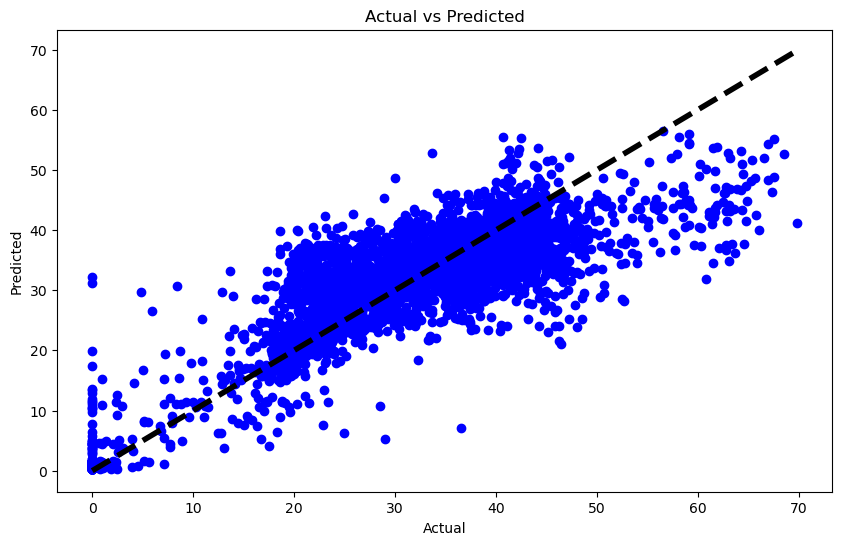

In [139]:
# The proximity of points to the line indicates model performance. 
# The line represents perfect prediction.
plt.figure(figsize=(10, 6))
plt.scatter(Y_test, Y_pred, color='blue')
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], 'k--', lw=4)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')
plt.show()

# 6. Feature Engineering (X^2,log(X), ...)¶

In [140]:
# Testing different model of features (X^2, ...) and Evaluate the model
# Codes under this title are commented since different methods are implemented with the same variable names (X,Y).
# In each method/output, different X and Y are used for experimentation.

## 6.1. Using Feature Engineering with Random Forest Regression

### 6.1.1. Using X^2

In [141]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius']]
# Y = data_final['mels_S']

# # Split the dataset into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# quadratic = PolynomialFeatures(degree=2)
# quadratic.fit(X_train)

# # Initialize the Random Forest Regressor
# rf_regressor = RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)

# # Fit the model to the training data
# X_quad = quadratic.fit_transform(X_train)
# rf_regressor.fit(X_quad, Y_train)

# # Make predictions on the test set
# X_quad_test = quadratic.fit_transform(X_test)
# Y_pred = rf_regressor.predict(X_quad_test)

# # Evaluating
# r2_score = metrics.r2_score(Y_test, Y_pred)                             # R-squared (Coefficient of Determination)
# print("r2_score is " + str(r2_score))

r2_score is 0.907581700183266


### 6.1.2. Using log(X)

In [142]:
# # Assume 'X' contains features (inputs) and 'Y' is the target (output)
# X = data_final[['occ_third_south','occ_fourth_south', 'air_temp_set_1', 'relative_humidity_set_1', 
#                 'solar_radiation_set_1', 'hp_hws_temp_celsius']]
# Y = data_final['mels_S']

# # Split the dataset into training and testing sets
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# transformer = FunctionTransformer(np.log1p)
# transformer.fit(X_train)

# # Initialize the Random Forest Regressor
# rf_regressor = RandomForestRegressor(n_estimators=100, criterion='squared_error', random_state=42)

# # Fit the model to the training data
# X_log = transformer.transform(X_train)
# rf_regressor.fit(X_log, Y_train)

# # Make predictions on the test set
# X_log_test = transformer.transform(X_test)
# Y_pred = rf_regressor.predict(X_log_test)

# # Evaluating
# r2_score = metrics.r2_score(Y_test, Y_pred)                             # R-squared (Coefficient of Determination)
# print("r2_score is " + str(r2_score))

r2_score is 0.9077365424384355
